In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import re
import math
import os
from sklearn.preprocessing import LabelEncoder

sns.set(style="whitegrid")

Načítanie všetkých údajov a kontrola, či sú prázdne

In [2]:
df_conn = pd.read_csv('../024/connections.csv', sep='\t')
df_dev = pd.read_csv('../024/devices.csv', sep='\t')
df_proc = pd.read_csv('../024/processes.csv', sep='\t')
df_prof = pd.read_csv('../024/profiles.csv', on_bad_lines='skip', sep='\t')
if df_conn.empty or df_dev.empty or df_proc.empty or df_prof.empty:
    print('Data is empty!')
else:
    print('Data loaded successfully!')
    datasets = {
        'Connections': df_conn,
        'Devices': df_dev,
        'Processes': df_proc,
        'Profiles': df_prof
    }


Data loaded successfully!


**Základný opis dát spolu s ich charakteristikami**

1.1 A:

Napíšeme metódu, ktorá vypíše informácie o rámci a popíše všetky vnútorné hodnoty, ako aj spočíta všetky vyplnené hodnoty

In [3]:
def A1b(x):
    name, df = list(datasets.items())[x]
    print(f'"{name}" dataset has {df.shape[0]} rows and {df.shape[1]} columns')
    
    print("\nDataFrame info:")
    df.info()
    
    print("\nDataFrame describe:")
    print(df.describe())
    
    missing_values = df.isnull().sum()
    print("\nMissing data in attributes:")
    print(missing_values[missing_values > 0])

In [4]:
A1b(0)

"Connections" dataset has 15061 rows and 13 columns

DataFrame info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15061 entries, 0 to 15060
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   ts                 15061 non-null  object 
 1   imei               15061 non-null  int64  
 2   mwra               15061 non-null  float64
 3   c.android.youtube  15061 non-null  float64
 4   c.dogalize         15061 non-null  float64
 5   c.android.gm       15061 non-null  float64
 6   c.katana           15061 non-null  float64
 7   c.android.chrome   15061 non-null  float64
 8   c.updateassist     15061 non-null  float64
 9   c.raider           15061 non-null  float64
 10  c.android.vending  15061 non-null  float64
 11  c.UCMobile.x86     15061 non-null  float64
 12  c.UCMobile.intl    15061 non-null  float64
dtypes: float64(11), int64(1), object(1)
memory usage: 1.5+ MB

DataFrame describe:
               ime

Súbor údajov obsahuje 15061 riadkov a 13 stĺpcov


Indexy riadkov sa pohybujú od 0 do 15 060.

objekt: stĺpec ts - čas

int64: stĺpec imei - ID zariadenia

float64: ďalších 11 stĺpcov


Chýbajúce hodnoty chýbajú vo všetkých stĺpcoch
(Urobme to isté pre všetky súbory údajov)

In [5]:
A1b(1)

"Devices" dataset has 2882 rows and 6 columns

DataFrame info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2882 entries, 0 to 2881
Data columns (total 6 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   latitude    2882 non-null   float64
 1   longitude   2882 non-null   float64
 2   store_name  2882 non-null   object 
 3   code        2878 non-null   object 
 4   location    2882 non-null   object 
 5   imei        2882 non-null   int64  
dtypes: float64(2), int64(1), object(3)
memory usage: 135.2+ KB

DataFrame describe:
         latitude    longitude          imei
count  2882.00000  2882.000000  2.882000e+03
mean     29.26384     8.685782  3.929463e+18
std      23.55665    71.906965  3.322250e+18
min     -54.80000  -156.474320  3.590434e+17
25%      15.48131   -60.931730  8.630331e+17
50%      36.76639     9.575600  3.590434e+18
75%      47.30997    68.117590  8.630331e+18
max      68.79833   178.004170  8.630331e+18

Missing data

Súbor údajov obsahuje 2882 riadkov a 6 stĺpcov

Indexy riadkov sú v rozsahu od 0 do 2881.

objekt: Stĺpce store_name,code,location

int64: stĺpec imei - identifikátor zariadenia

float64: zemepisná šírka,dĺžka

Chýbajúce hodnoty v stĺpci kód, konkrétne 4 chýbajúce hodnoty

In [6]:
A1b(2)

"Processes" dataset has 15061 rows and 23 columns

DataFrame info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15061 entries, 0 to 15060
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ts                          15061 non-null  object 
 1   imei                        15061 non-null  int64  
 2   mwra                        15061 non-null  float64
 3   p.android.chrome            15061 non-null  float64
 4   p.android.settings          15061 non-null  float64
 5   p.android.documentsui       15061 non-null  float64
 6   p.system                    15061 non-null  float64
 7   p.android.externalstorage   15061 non-null  float64
 8   p.android.packageinstaller  15061 non-null  float64
 9   p.android.gm                15061 non-null  float64
 10  p.dogalize                  15061 non-null  float64
 11  p.olauncher                 15061 non-null  float64
 12  p.process.gapps      

Súbor údajov obsahuje 15061 riadkov a 23 stĺpcov

Indexy riadkov sa pohybujú od 0 do 15060

objekt: stĺpce ts - čas

int64: stĺpce imei - ID zariadenia

float64: ďalších 21 stĺpcov

Chýbajúce hodnoty chýbajú vo všetkých stĺpcoch

In [7]:
A1b(3)

"Profiles" dataset has 2618 rows and 12 columns

DataFrame info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2618 entries, 0 to 2617
Data columns (total 12 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   registration      2618 non-null   object
 1   birthdate         1440 non-null   object
 2   current_location  2487 non-null   object
 3   company           2618 non-null   object
 4   ssn               2618 non-null   object
 5   residence         916 non-null    object
 6   imei              2618 non-null   int64 
 7   user_id           2618 non-null   int64 
 8   name              2618 non-null   object
 9   username          2618 non-null   object
 10  mail              2618 non-null   object
 11  job               785 non-null    object
dtypes: int64(2), object(10)
memory usage: 245.6+ KB

DataFrame describe:
               imei      user_id
count  2.618000e+03  2618.000000
mean   3.914570e+18  1294.042017
std    3.34

Súbor údajov obsahuje 2618 riadkov a 12 stĺpcov

Indexy riadkov sú v rozsahu od 0 do 2617.

objekt: stĺpce ts - čas

int64: stĺpce imei - ID zariadenia

float64: ďalších 21 stĺpcov

Chýbajúce hodnoty sa nachádzajú v:
dátum narodenia 1178
current_location 131
bydlisko 1702
zamestnanie 1833
A to znamená, že údaje je potrebné pred použitím na analýzu filtrovať a analyzovať, čo uvidíme neskôr

1.1 B:
Analyzujme každý súbor údajov a pozrime sa na rozdelenie, histogramy, krabicové grafy atď., aby sme zistili, aké kvalitné sú naše údaje.

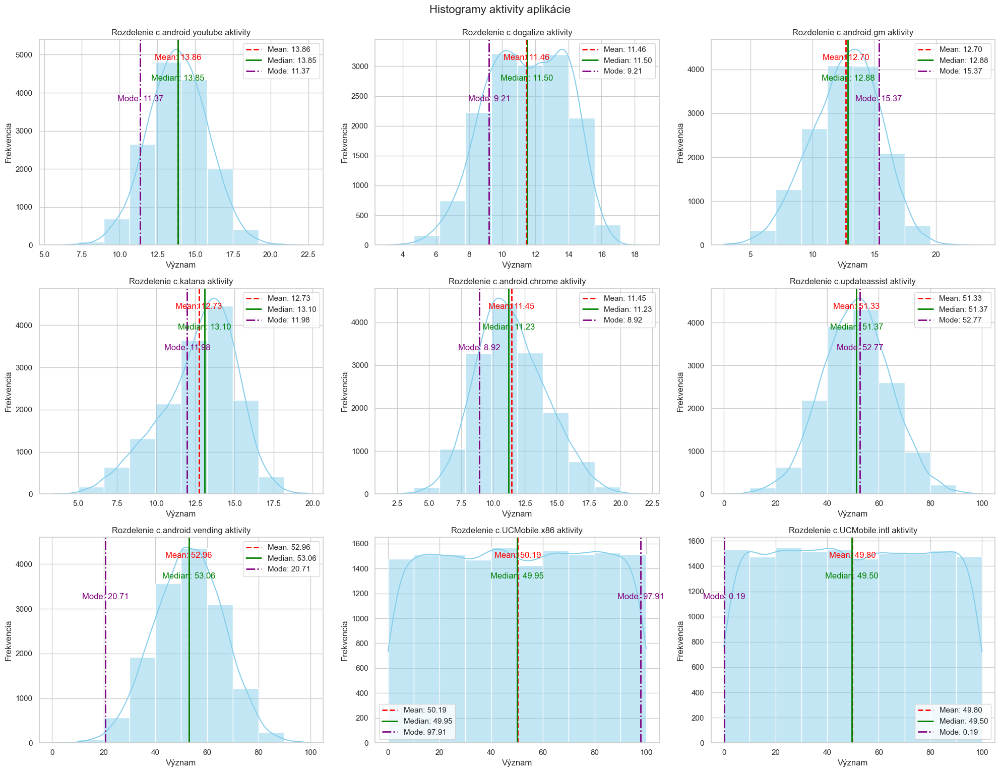

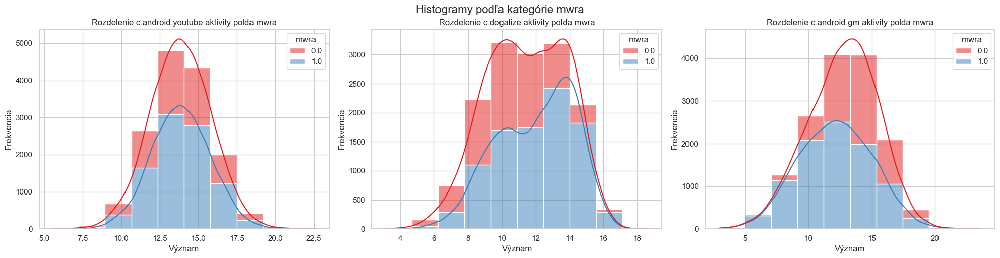

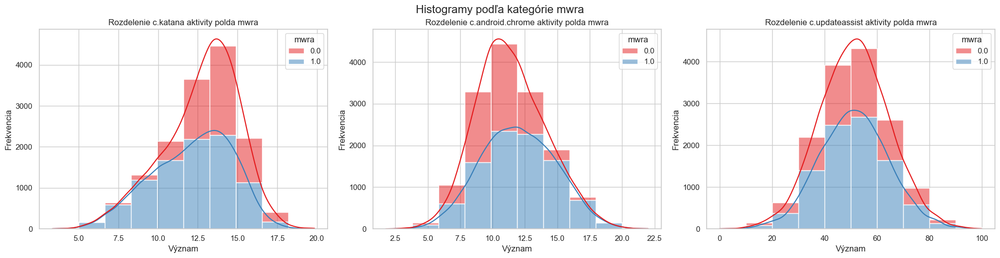

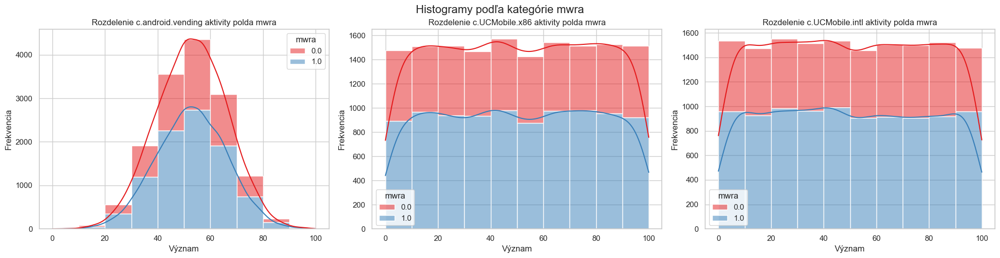

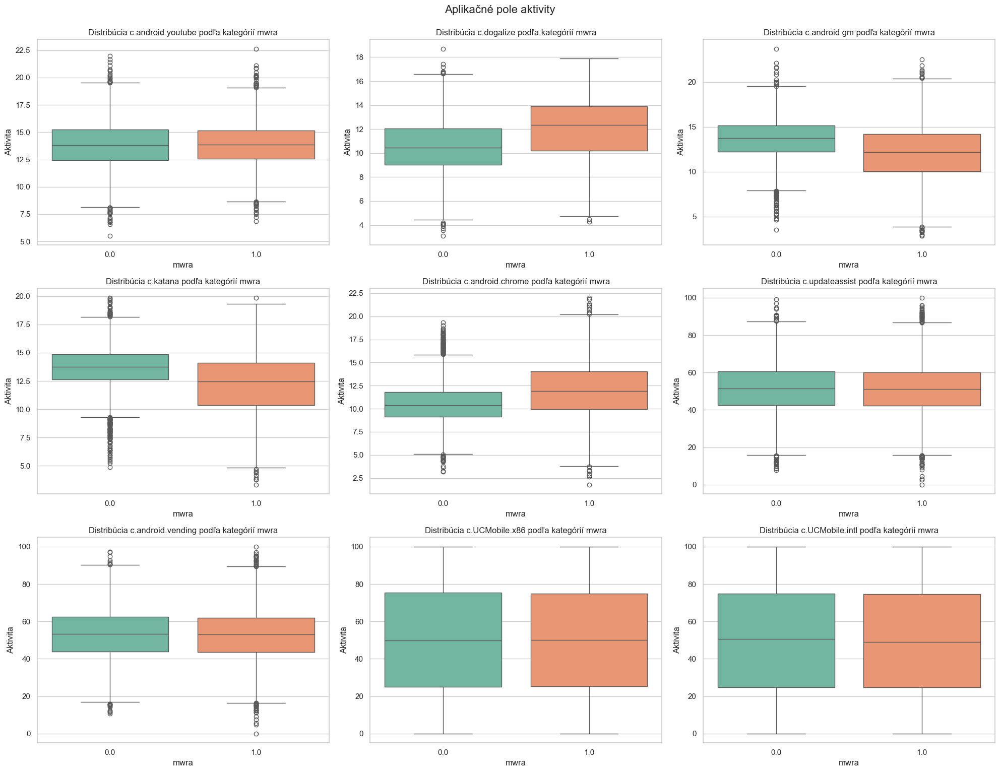

...

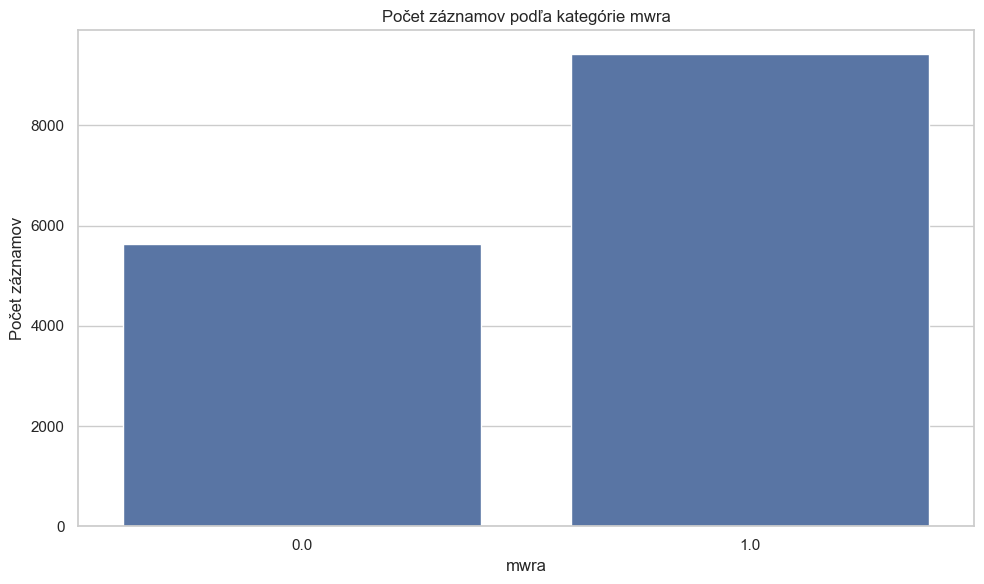

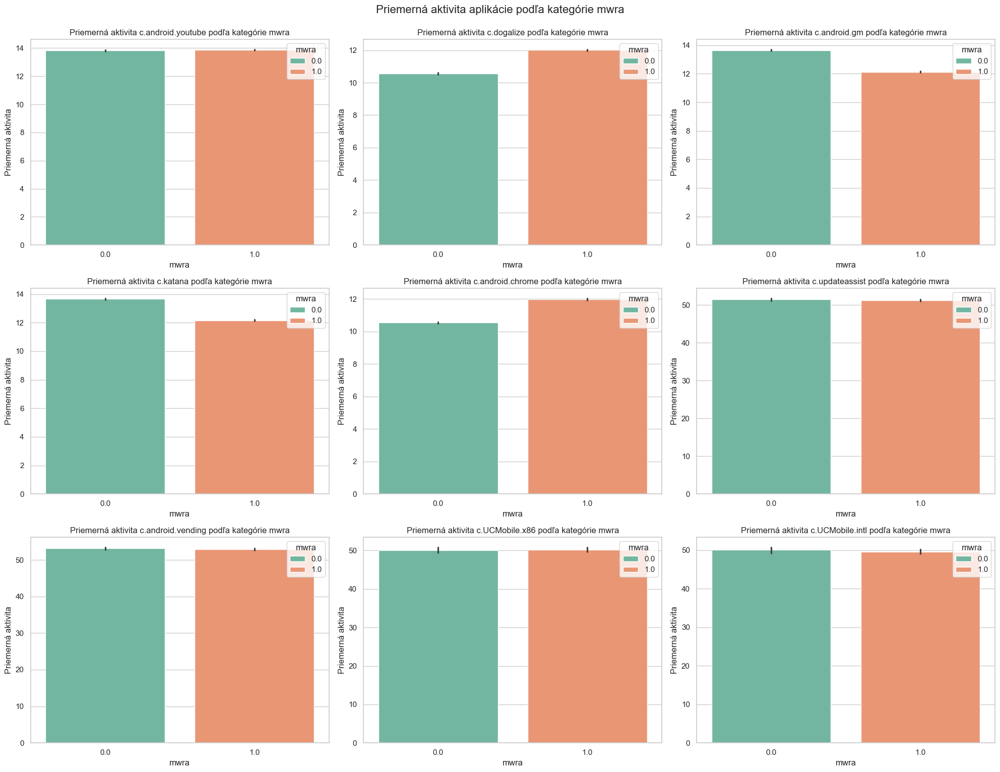

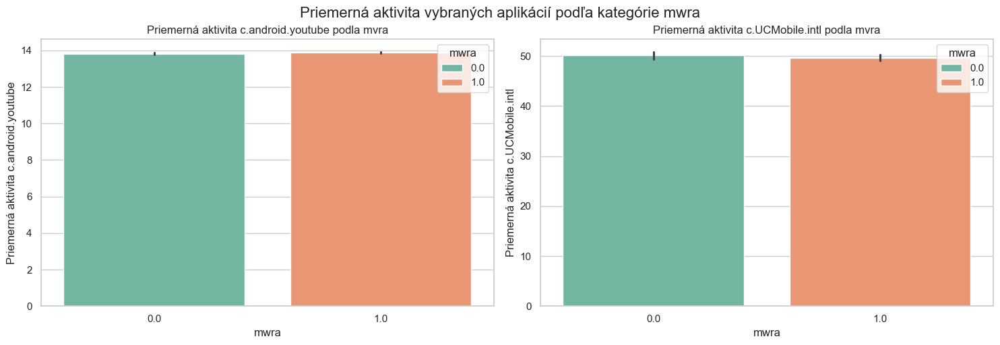

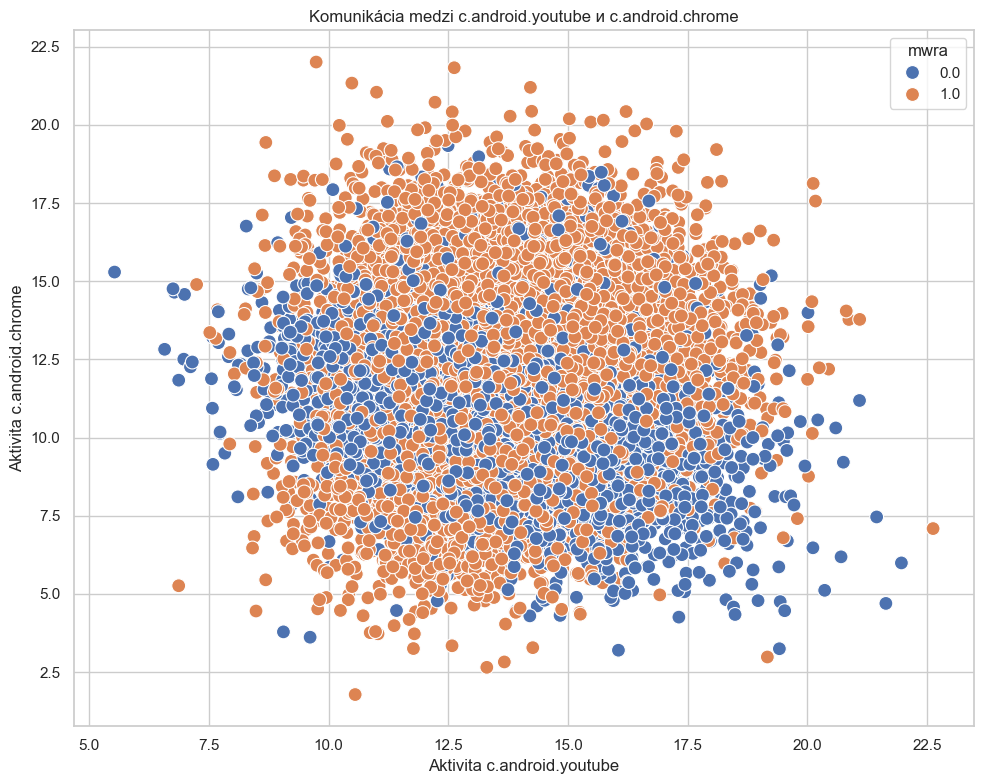

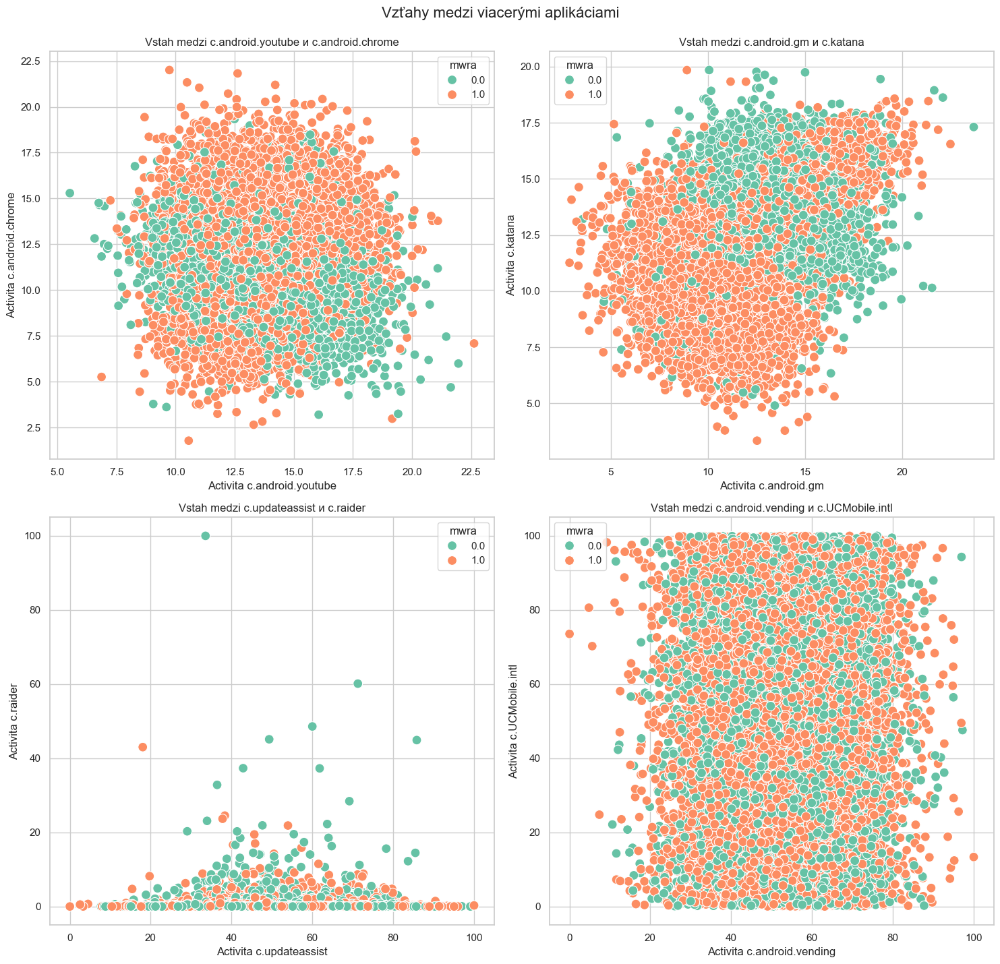

In [8]:

def analyze_connections(df):
    apps = [
        'c.android.youtube', 'c.dogalize', 'c.android.gm', 'c.katana', 
        'c.android.chrome', 'c.updateassist', 
        'c.android.vending', 'c.UCMobile.x86', 'c.UCMobile.intl'
    ]
    for app in apps:
        if app not in df.columns:
            print(f"'Stĺpec {app}' chýba v DataFrame.")
            continue  

    
    selected_apps = ['c.android.youtube', 'c.UCMobile.intl']

    # 1. Histogramy
    num_apps = len(apps)
    cols = 3
    rows = math.ceil(num_apps / cols)
    
    fig_hist, axes_hist = plt.subplots(rows, cols, figsize=(20, 5 * rows))
    axes_hist = axes_hist.flatten()
    
    for i, app in enumerate(apps):
        # Calculate statistics
        mean_val = df[app].mean()
        median_val = df[app].median()
        mode_val = df[app].mode()[0] 
        
        # Create histogram
        sns.histplot(df[app], bins=10, kde=True, color='skyblue', ax=axes_hist[i])
        
        # Add vertical lines for mean, median, and mode
        axes_hist[i].axvline(mean_val, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_val:.2f}')
        axes_hist[i].axvline(median_val, color='green', linestyle='-', linewidth=2, label=f'Median: {median_val:.2f}')
        axes_hist[i].axvline(mode_val, color='purple', linestyle='-.', linewidth=2, label=f'Mode: {mode_val:.2f}')
        
        # Add labels for mean, median, and mode
        axes_hist[i].text(mean_val, axes_hist[i].get_ylim()[1] * 0.9, f'Mean: {mean_val:.2f}', color='red', ha='center')
        axes_hist[i].text(median_val, axes_hist[i].get_ylim()[1] * 0.8, f'Median: {median_val:.2f}', color='green', ha='center')
        axes_hist[i].text(mode_val, axes_hist[i].get_ylim()[1] * 0.7, f'Mode: {mode_val:.2f}', color='purple', ha='center')
        
        axes_hist[i].set_title(f'Rozdelenie {app} aktivity')
        axes_hist[i].set_xlabel('Význam')
        axes_hist[i].set_ylabel('Frekvencia')
        axes_hist[i].legend()
    
    # Remove unused axes
    for j in range(num_apps, len(axes_hist)):
        fig_hist.delaxes(axes_hist[j])
    
    fig_hist.tight_layout()
    fig_hist.suptitle('Histogramy aktivity aplikácie', fontsize=16, y=1.02)
    plt.show()
    plt.close(fig_hist)


    
    # 2. Histogramy po mwra
    apps_per_fig = 3
    for start in range(0, len(apps), apps_per_fig):
        subset_apps = apps[start:start + apps_per_fig]
        num_subset = len(subset_apps)
        cols_subset = 3
        rows_subset = math.ceil(num_subset / cols_subset)
        
        fig_hist_mwra, axes_hist_mwra = plt.subplots(rows_subset, cols_subset, figsize=(20, 5 * rows_subset))
        axes_hist_mwra = axes_hist_mwra.flatten()
        
        for i, app in enumerate(subset_apps):
            sns.histplot(
                data=df, x=app, bins=10, kde=True, palette='Set1', multiple='stack', ax=axes_hist_mwra[i], hue='mwra'
            )
            axes_hist_mwra[i].set_title(f'Rozdelenie {app} aktivity polda mwra')
            axes_hist_mwra[i].set_xlabel('Význam')
            axes_hist_mwra[i].set_ylabel('Frekvencia')
            handles, labels = axes_hist_mwra[i].get_legend_handles_labels()
            if handles:
                axes_hist_mwra[i].legend(title='mwra')
        
        for j in range(num_subset, len(axes_hist_mwra)):
            fig_hist_mwra.delaxes(axes_hist_mwra[j])
        
        fig_hist_mwra.tight_layout()
        fig_hist_mwra.suptitle('Histogramy podľa kategórie mwra', fontsize=16, y=1.02)
        plt.show()
        plt.close(fig_hist_mwra)
    
    # 3 Boxplot
    num_box_apps = len(apps)
    cols_box = 3
    rows_box = math.ceil(num_box_apps / cols_box)
    
    fig_box, axes_box = plt.subplots(rows_box, cols_box, figsize=(20, 5 * rows_box))
    axes_box = axes_box.flatten()
    
    for i, app in enumerate(apps):
        sns.boxplot(
            x='mwra', y=app, data=df, palette='Set2', dodge=False, ax=axes_box[i], hue='mwra'
        )
        axes_box[i].set_title(f'Distribúcia {app} podľa kategórií mwra')
        axes_box[i].set_xlabel('mwra')
        axes_box[i].set_ylabel('Aktivita')
        axes_box[i].legend([], [], frameon=False) 
    
    for j in range(num_box_apps, len(axes_box)):
        fig_box.delaxes(axes_box[j])
    
    fig_box.tight_layout()
    fig_box.suptitle('Aplikačné pole aktivity', fontsize=16, y=1.02)
    plt.show()
    plt.close(fig_box)
    
    #4. Krabicové grafy pre vybrané aplikácie
    num_selected = len(selected_apps)
    cols_sel_box = 2
    rows_sel_box = math.ceil(num_selected / cols_sel_box)
    
    fig_box_sel, axes_box_sel = plt.subplots(rows_sel_box, cols_sel_box, figsize=(15, 5 * rows_sel_box))
    axes_box_sel = axes_box_sel.flatten()
    
    for i, app in enumerate(selected_apps):
        sns.boxplot(
            x='mwra', y=app, data=df, palette='Set2', dodge=False, ax=axes_box_sel[i], hue='mwra'
        )
        axes_box_sel[i].set_title(f'Distribúcia {app} podla mwra')
        axes_box_sel[i].set_xlabel('mwra')
        axes_box_sel[i].set_ylabel(f'Aktivita {app}')
        axes_box_sel[i].legend([], [], frameon=False)
    
    for j in range(num_selected, len(axes_box_sel)):
        fig_box_sel.delaxes(axes_box_sel[j])
    
    fig_box_sel.tight_layout()
    fig_box_sel.suptitle('Krabicové grafy pre vybrané aplikácie', fontsize=16, y=1.02)
    plt.show()
    plt.close(fig_box_sel)
    
    # 5.  (Countplot)
    fig_count, ax_count = plt.subplots(figsize=(10, 6))
    sns.countplot(x='mwra', data=df, ax=ax_count)
    ax_count.set_title('Počet záznamov podľa kategórie mwra')
    ax_count.set_xlabel('mwra')
    ax_count.set_ylabel('Počet záznamov')
    fig_count.tight_layout()
    plt.show()
    plt.close(fig_count)
    
    # 6. Barplot 
    num_bar_apps = len(apps)
    cols_bar = 3
    rows_bar = math.ceil(num_bar_apps / cols_bar)
    
    fig_bar, axes_bar = plt.subplots(rows_bar, cols_bar, figsize=(20, 5 * rows_bar))
    axes_bar = axes_bar.flatten()
    
    for i, app in enumerate(apps):
        sns.barplot(x='mwra', y=app, data=df, ax=axes_bar[i], palette='Set2', hue='mwra')
        axes_bar[i].set_title(f'Priemerná aktivita {app} podľa kategórie mwra')
        axes_bar[i].set_xlabel('mwra')
        axes_bar[i].set_ylabel('Priemerná aktivita')
    
    for j in range(num_bar_apps, len(axes_bar)):
        fig_bar.delaxes(axes_bar[j])
    
    fig_bar.tight_layout()
    fig_bar.suptitle('Priemerná aktivita aplikácie podľa kategórie mwra', fontsize=16, y=1.02)
    plt.show()
    plt.close(fig_bar)
    
    #7. Porovnávacie grafy pre vybrané aplikácie
    num_sel_bar = len(selected_apps)
    cols_sel_bar = 2
    rows_sel_bar = math.ceil(num_sel_bar / cols_sel_bar)
    
    fig_bar_sel, axes_bar_sel = plt.subplots(rows_sel_bar, cols_sel_bar, figsize=(15, 5 * rows_sel_bar))
    axes_bar_sel = axes_bar_sel.flatten()
    
    for i, app in enumerate(selected_apps):
        sns.barplot(x='mwra', y=app, data=df, ax=axes_bar_sel[i], palette='Set2', hue='mwra')
        axes_bar_sel[i].set_title(f'Priemerná aktivita {app} podla mvra')
        axes_bar_sel[i].set_xlabel('mwra')
        axes_bar_sel[i].set_ylabel(f'Priemerná aktivita {app}')
    
    # Удаляем пустые подграфики, если есть
    for j in range(num_sel_bar, len(axes_bar_sel)):
        fig_bar_sel.delaxes(axes_bar_sel[j])
    
    fig_bar_sel.tight_layout()
    fig_bar_sel.suptitle('Priemerná aktivita vybraných aplikácií podľa kategórie mwra', fontsize=16, y=1.02)
    plt.show()
    plt.close(fig_bar_sel)
    
    # 8. Scatterplot
    fig_scatter, ax_scatter = plt.subplots(figsize=(10, 8))
    sns.scatterplot(
        x='c.android.youtube', y='c.android.chrome', hue="mwra", data=df, palette='deep', s=100, ax=ax_scatter
    )
    ax_scatter.set_title('Komunikácia medzi c.android.youtube и c.android.chrome')
    ax_scatter.set_xlabel('Aktivita c.android.youtube')
    ax_scatter.set_ylabel('Aktivita c.android.chrome')
    fig_scatter.tight_layout()
    plt.show()
    plt.close(fig_scatter)
    

    # 10. Vzťahy medzi viacerými aplikáciami
    pairs = [
        ('c.android.youtube', 'c.android.chrome'),
        ('c.android.gm', 'c.katana'),
        ('c.updateassist', 'c.raider'),
        ('c.android.vending', 'c.UCMobile.intl')
    ]
    
    num_pairs = len(pairs)
    cols_pairs = 2
    rows_pairs = math.ceil(num_pairs / cols_pairs)
    
    fig_scatter_pairs, axes_scatter_pairs = plt.subplots(rows_pairs, cols_pairs, figsize=(15, 7 * rows_pairs))
    axes_scatter_pairs = axes_scatter_pairs.flatten()
    
    for i, (x_var, y_var) in enumerate(pairs):
        sns.scatterplot(
            x=x_var, y=y_var, hue="mwra", data=df, palette='Set2', s=100, ax=axes_scatter_pairs[i]
        )
        axes_scatter_pairs[i].set_title(f'Vstah medzi {x_var} и {y_var}')
        axes_scatter_pairs[i].set_xlabel(f'Activita {x_var}')
        axes_scatter_pairs[i].set_ylabel(f'Activita {y_var}')
    
    for j in range(num_pairs, len(axes_scatter_pairs)):
        fig_scatter_pairs.delaxes(axes_scatter_pairs[j])
    
    fig_scatter_pairs.tight_layout()
    fig_scatter_pairs.suptitle('Vzťahy medzi viacerými aplikáciami', fontsize=16, y=1.02)
    plt.show()
    plt.close(fig_scatter_pairs)
    
analyze_connections(df_conn)

Zhrnutie histogramov:

1. Rozdelenie aktivity c.android.youtube.
Hodnoty aktivity sa pohybujú od 5 do 20.
Najvyššia frekvencia aktivity sa pohybuje okolo hodnoty 13-15.
Rozdelenie sa podobá normálnemu rozdeleniu s miernym sklonom doprava.
2. Distribúcia aktivity s.dogalise
Hodnoty aktivity sú rozdelené od 6 do 18.
Najvyššia frekvencia aktivity je sústredená medzi hodnotami 10 a 14.
Histogram ukazuje rozdelenie, ktoré je blízke symetrickému.
3. Distribúcia aktivity z.android.gm
Hodnoty aktivity sa nachádzajú v rozmedzí od 5 do 20.
Maximálna frekvencia aktivity sa vyskytuje pri hodnotách okolo 13 až 16.
Histogram je symetrický a má rozdelenie v tvare zvona.
4. Distribúcia aktivity z.katana
Hodnoty sa pohybujú od 5 do 20.
Najvyššia frekvencia aktivity je tiež v rozsahu 12-15.
Údaje majú normálne rozdelenie.
5. Rozdelenie aktivity s.android.chrome
Hodnoty aktivity sa nachádzajú v rozmedzí od 2,5 do 22,5.
Najvyššia frekvencia aktivity je sústredená v rozsahu 10-13.
Histogram je symetrický s malou pravou „chvostovou“ časťou.
6. Rozdelenie aktivity c.updateassist
Hodnoty sa pohybujú od 0 do 100.
Najvyššia frekvencia aktivity sa vyskytuje pri hodnotách medzi 50 a 60.
Vidno niekoľko vrcholov, čo môže naznačovať multimodálne rozdelenie.
7. Distribúcia aktivity z.android.vending
Rozsah hodnôt aktivity je od 20 do 100.
Frekvencia je najvyššia v rozsahu 50 až 60.
Histogram má mierne symetrické rozdelenie.
8. Distribúcia aktivity s.UCMobile.x86
Hodnoty aktivity sú rozložené od 0 do 100.
Frekvencia aktivity je rovnomerne rozložená v celom rozsahu, čo naznačuje takmer rovnomerné rozdelenie.
9. Distribúcia aktivity s.UCMobile.intl
Hodnoty aktivity sa pohybujú od 0 do 100.
Graf ukazuje rovnomerné rozdelenie v celom rozsahu hodnôt.

Všeobecné pozorovania:
Pre väčšinu aplikácií platí normálne alebo symetrické rozdelenie aktivity s hlavným vrcholom v strednej časti rozsahu (najmä pre c.android.youtube, c.android.chrome, c.android.gm a ďalšie).
Niektoré aplikácie, napríklad updateassist, UCMobile.x86 a UCMobile.intl, vykazujú rovnomernejšie rozloženie hodnôt aktivity alebo majú viacero vrcholov.


Zhrnutie histogramov vzhľadom na mvra:

android.youtube podľa kategórie mvra
Modrý a červený graf ukazujú podobné rozdelenie, pričom aktivita dosahuje vrchol medzi hodnotami 12 a 15.
Kategória „mvra = 0“ má v tomto rozsahu väčšiu aktivitu.

Rozdelenie aktivity c.dogalise podľa kategórie mvra
Obe rozdelenia sú podobné, ale kategória „mvra = 1“ má väčší vrchol aktivity medzi hodnotami 11 a 14.
Aktivita v kategórii „mvra = 0“ je menej výrazná.

Rozdelenie aktivity c.android.gm podľa kategórie mvra
Aj v tomto prípade sú rozloženia podobné, ale kategória „mvra = 1“ dominuje v rozsahu 12 až 16.
Kategória „mvra = 0“ má v porovnaní s kategóriou „mvra = 1“ v rovnakom rozsahu mierny pokles.

Rozdelenie aktivity c.katana podľa kategórií mvra
Rozdelenia majú blízky tvar, ale kategória „mvra = 1“ má mierne výraznejší vrchol v rozsahu 12 - 15.
„mvra = 0“ zaberá viac priestoru do 12.

Rozdelenie aktivity c.android.chrome podľa kategórie mvra
Kategória „mvra = 1“ dominuje v rozsahu od 10 do 15.
Kategória „mvra = 0“ má plynulejšie rozloženie s menej výrazným vrcholom.

Rozdelenie aktivity c.updateassist podľa kategórie mvra
Histogramy ukazujú výrazný rozdiel: „mvra = 1“ dominuje v rozsahu 50 až 60.
„mvra = 0“ má rovnomernejšie rozloženie v celom rozsahu.

Rozdelenie aktivity c.android.vending podľa kategórie mvra
V oboch prípadoch je vrchol aktivity medzi 50 a 60.
„mvra = 1“ vykazuje jasnejší vrchol, zatiaľ čo ‚mvra = 0‘ je v tomto rozsahu o niečo slabší.

Rozdelenie aktivity s.UCMobile.x86 podľa kategórie mvra
Kategória „mvra = 0“ má výraznejší vrchol v rozsahu 40 - 60.
Kategória „mvra = 1“ má rovnomernejšie rozloženie aktivity.

Rozdelenie aktivity z.UCMobile.intl podľa kategórie mvra
Obe rozdelenia sú podobné a rovnomerne rozložené v celom rozsahu hodnôt.
Kategória „mvra = 1“ je mierne výraznejšia v rozsahu 20 až 60.

Všeobecné pozorovania:
Vo väčšine prípadov majú kategórie „mvra = 1“ výraznejšie vrcholy aktivity v strednej časti rozsahov, čo môže poukazovať na koncentrovanejšie používanie aplikačných údajov v tejto kategórii.
Kategória „mwra = 0“ má skôr hladšie rozloženie, čo naznačuje rovnomernejšie rozloženie činnosti.



Celkové súčty na boxcharte:

Rozdelenie aktivity c.android.youtube podľa kategórie mwra
Medián aktivity pre obe kategórie je blízky, ale rozsah aktivity pre „mwra = 1“ je o niečo väčší.
V oboch kategóriách je viditeľných niekoľko odľahlých hodnôt.

Rozdelenie aktivity c.dogalise podľa kategórie mwra
Medián aktivity pre „mwra = 1“ je vyšší ako pre „mwra = 0“.
Kategória „mwra = 1“ má širší rozsah, čo naznačuje väčšiu variabilitu aktivity.

Rozdelenie aktivity c.android.gm podľa kategórie mwra
Medián aktivity pre „mwra = 1“ je vyšší ako pre „mwra = 0“.
Obe kategórie vykazujú odľahlé hodnoty, ale kategória „mwra = 1“ vykazuje viac aktivity v medzikvartilovom rozsahu.

Rozdelenie aktivity c.katana podľa kategórie mwra
Medián aktivity pre obe kategórie je blízky.
Kategória „mwra = 1“ má širší rozsah hodnôt ako kategória „mwra = 0“.

Rozdelenie aktivity c.android.chrome podľa kategórie mwra
Medián aktivity pre kategóriu „mwra = 1“ je o niečo vyšší ako pre kategóriu „mwra = 0“.
„mwra = 1“ má širší rozsah aktivity.

Rozdelenie aktivity c.updateassist podľa kategórie mwra
Odľahlé hodnoty sú viditeľné pre obe kategórie, ale medián aktivity pre „mwra = 1“ je vyšší.
Rozsah aktivity pre „mwra = 1“ pokrýva vyššie hodnoty ako pre „mwra = 0“.

Rozdelenie aktivity c.android.vending podľa kategórie mwra
Medián aktivity pre obe kategórie je podobný, ale rozsah hodnôt pre „mwra = 1“ je väčší.
Odľahlé hodnoty sú viditeľné v oboch kategóriách, najmä pre „mwra = 0“.

Rozdelenie aktivity c.UCMobile.x86 podľa kategórie mwra
Medián aktivity pre obe kategórie je blízky, ale rozsah aktivity je väčší pre „mwra = 1“.
V kategórii „mwra = 1“ sa vyskytujú špičky aktivity.

Rozdelenie aktivity c.UCMobile.intl podľa kategórie mwra
Obe kategórie majú podobné rozsahy aktivity, s mierne vyšším mediánom pre „mwra = 1“.
Emisie sú prítomné v oboch kategóriách.

Všeobecné pozorovania:
Takmer vo všetkých prípadoch má aktivita pre kategóriu „mwra = 1“ väčší rozsah a vyššie mediány, čo môže naznačovať vyššie používanie aplikácie pre túto kategóriu.
Odľahlé hodnoty aktivity sú prítomné takmer v každej kategórii, čo naznačuje, že existujú významné, ale zriedkavé prípady s veľmi vysokou alebo veľmi nízkou aktivitou.



Count Plot sumals:

Rozdelenie aktivity c.android.youtube podľa kategórie mwra :

Graf (boxplot) zobrazuje medián, medzikvartilové rozpätie, odľahlé hodnoty a rozsah aktivity pre aplikáciu.
Pre obe kategórie aktivity vyzerá rozloženie hodnôt približne rovnako, hoci v kategórii 0 je niekoľko odľahlých hodnôt.
Mediány aktivít v oboch kategóriách sú približne rovnaké, okolo 12,5, s rozpätím od 7,5 do 20 jednotiek.

Rozdelenie aktivity c.UCMobile.intl podľa kategórie mwra):
Graf aj krabicového vylepšenia pre aplikáciu UC Mobile ukazuje väčšie rozpätie hodnôt.
Mediány pre obe kategórie sa pohybujú okolo 60 až 65, hoci rozpätie aktivity je väčšie, od 40 do 80 jednotiek.


Počet záznamov podľa kategórie mwra:
Tento stĺpcový graf znázorňuje počet záznamov (činností) v jednotlivých kategóriách.
Kategória mwra = 1 má výrazne viac záznamov (~ 8500) v porovnaní s kategóriou mwra = 0 (~ 5500 záznamov), čo naznačuje viac pozorovaní v kategórii 1.
Kľúčové zistenia:
Aktivita aplikácie sa líši, ale mediány aktivít pre každú kategóriu „mwra“ zostávajú blízko seba, čo naznačuje, že rozdiely v aktivitách medzi kategóriami sú minimálne.
Počet záznamov je výrazne vyšší pre kategóriu mwra = 1, čo môže naznačovať väčšie zastúpenie alebo aktivitu v tejto skupine.


Kľúčové pozorovania priemernej aktivity vo vzťahu k mwra:
Grafy vizualizujú rozdiel v aktivite pre jednotlivé kategórie „mwra“ pre každú aplikáciu.
V niektorých aplikáciách, ako napríklad c.android.youtube, c.android.gm a c.katana, je priemerná aktivita vo všetkých kategóriách „mwra“ takmer rovnaká.
V iných aplikáciách, ako napríklad c.updateassist, UCMobile a UCMobile.x86, je zreteľný rozdiel v aktivite medzi kategóriami.
Maximálna aktivita (os Y) v prípade niektorých aplikácií dosahuje hodnotu 50, čo pravdepodobne odráža vysokú úroveň interakcie.




Výsledky rozptylového grafu:

Rozptylový graf ukazuje slabú koreláciu medzi aktivitou používateľov na YouTube a Chrome.
Väčšina údajov je sústredená v strednej časti grafu.
Určitá diferenciácia na premennej mwra je viditeľná, ale na prvý pohľad nie je zrejmý žiadny rozdiel v trendoch správania pre tieto dve kategórie.
Analýza:
Predbežne môžeme konštatovať, že existuje mierny vzťah medzi aktivitou na YouTube a Chrome, ale korelácia sa nezdá byť silne vyjadrená.


„Korelácia medzi c.android.youtube a c.android.chrome.“
Body sú oddelené farbou premennej mwra (modrá pre 0,0, hnedá pre 1,0), rovnako ako v predchádzajúcom grafe. Väčšina údajov je sústredená v strede a tvorí hustý oblak. Medzi aktivitami YouTube a Chrome nie je vidieť žiadnu výraznú koreláciu.

„Korelácia medzi c.android.gm a c.katana“.
Na rozlíšenie farieb (modrej a hnedej) sa tu používa aj premenná mwra. Bodky v grafe sú zoskupené s hustým zhlukom v strede, čo môže naznačovať slabú až strednú koreláciu medzi aktivitou v aplikáciách Gmail a Facebook (katana).

„Korelácia medzi c.updateassist a c.raider.“
Graf sa od predchádzajúcich líši tým, že tu sú body oveľa menej koncentrované. Pozorujeme niekoľko bodov s vysokou aktivitou (viac ako 40 na oboch osiach), ale väčšina hodnôt je sústredená v dolnej časti (nízka aktivita v oboch aplikáciách).

„Vzťah medzi aplikáciami c.android.vending a c.UCMobile.intl.“
Tento graf je podobný predchádzajúcim s hustým rozložením bodov v strednej časti, pričom premenná mwra je oddelená farbou. Korelácia medzi aktivitou v obchode Play (vending) a prehliadačom UC sa zdá byť mierna, hoci bodky sú tiež husto zoskupené.

Celkovo všetky grafy ukazujú rôzne korelácie medzi aktivitou v rôznych aplikáciách Android, pričom premenná mwra slúži ako značka na zvýraznenie rozdielov medzi používateľmi.


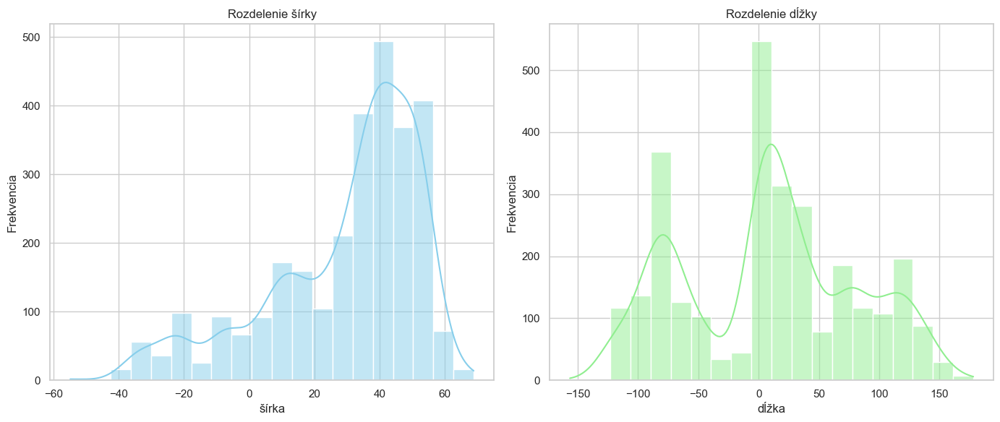

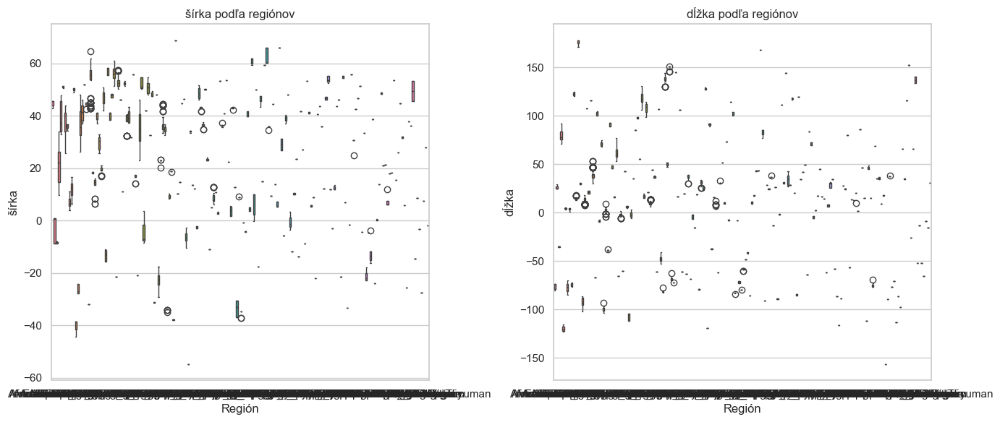

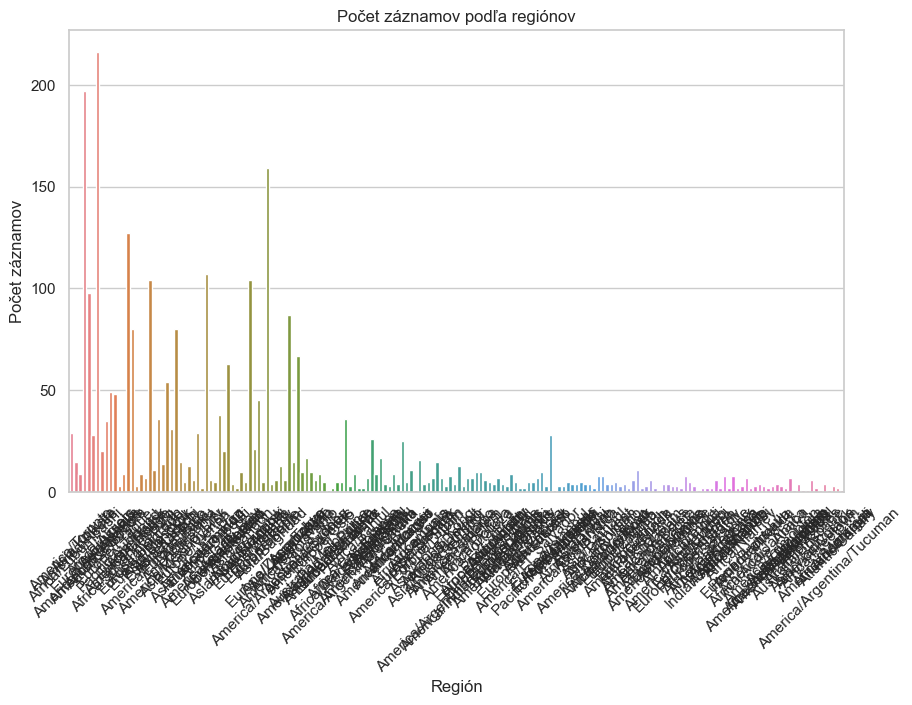

In [9]:
def analyze_devices(df):
   # 1. Histogramy pre šírku a dĺžku
    plt.figure(figsize=(14, 6))

    # Histogram pre  šírku
    plt.subplot(1, 2, 1)
    sns.histplot(df['latitude'], bins=20, kde=True, color='skyblue')
    plt.title('Rozdelenie šírky')
    plt.xlabel('šírka')
    plt.ylabel('Frekvencia')

    # Histogram pre  dĺžku
    plt.subplot(1, 2, 2)
    sns.histplot(df['longitude'], bins=20, kde=True, color='lightgreen')
    plt.title('Rozdelenie dĺžky')
    plt.xlabel('dĺžka')
    plt.ylabel('Frekvencia')

    plt.tight_layout()
    plt.show()

    # 2. Krabicové diagramy pre  šírku a dĺžku podľa regiónov
    plt.figure(figsize=(14, 6))
    
    # Krabicový diagram pre šírku podľa regiónov
    plt.subplot(1, 2, 1)
    sns.boxplot(x='location', y='latitude', data=df, hue='location', dodge=False)
    plt.title('šírka podľa regiónov')
    plt.xlabel('Región')
    plt.ylabel('šírka')
    plt.legend([], [], frameon=False) 

    # Krabicový diagram pre dĺžku podľa regiónov
    plt.subplot(1, 2, 2)
    sns.boxplot(x='location', y='longitude', data=df, hue='location', dodge=False)
    plt.title('dĺžka podľa regiónov')
    plt.xlabel('Región')
    plt.ylabel('dĺžka')
    plt.legend([], [], frameon=False) 

    plt.tight_layout()
    plt.show()

    # 4. Stĺpcové grafy počtu záznamov podľa regiónov
    plt.figure(figsize=(10, 6))
    sns.countplot(x='location', data=df, hue='location')
    plt.title('Počet záznamov podľa regiónov')
    plt.xlabel('Región')
    plt.ylabel('Počet záznamov')
    plt.xticks(rotation=45)
    plt.show()

analyze_devices(df_dev)


Celkové hodnoty histogramu:

 „Distribúcia zemepisnej šírky.
Toto je histogram rozdelenia hodnôt zemepisnej šírky, ktorý zobrazuje frekvenciu rôznych hodnôt. Je vidieť, že väčšina údajov sa sústreďuje medzi 20 a 60 stupňami zemepisnej šírky, s maximálnou frekvenciou približne 500 okolo 40 až 60 stupňov.

„Distribúcia zemepisnej dĺžky.
Histogram zobrazujúci rozdelenie hodnôt zemepisnej dĺžky, podobne ako v prvom grafe. Väčšina údajov je sústredená okolo nulovej zemepisnej dĺžky (v blízkosti greenwichského poludníka), s dvoma výraznými vrcholmi: jeden okolo -50 až 0, druhý okolo 0 až 50. Existuje pozoruhodný počet hodnôt s dĺžkou medzi -150 a 150 stupňami.


Krabicové grafy:

„Zemepisná šírka podľa regiónov“.
Toto je graf rozptylu, ktorý zobrazuje rozloženie zemepisnej šírky v rôznych regiónoch. Bodky a kruhy rôznych veľkostí označujú konkrétne hodnoty zemepisnej šírky pre rôzne regióny. K dispozícii sú aj prvky boxplot (zvislé čiary), ktoré označujú rozloženie údajov v jednotlivých regiónoch.

„Zemepisná dĺžka podľa regiónov“.
Tento graf je podobný predchádzajúcemu grafu


Stĺpcový graf:

Väčšina stĺpcov je zoskupená vľavo, čo znamená, že pre niekoľko regiónov existuje veľký počet záznamov, zatiaľ čo pravé stĺpce majú oveľa menšiu výšku, čo znamená menší počet záznamov pre tieto regióny.
Celkový záver:
V grafe je vizualizované rozloženie záznamov v jednotlivých regiónoch a možno pozorovať, že niekoľko regiónov má výrazne vyšší počet záznamov, čo môže naznačovať väčšiu aktivitu alebo veľkosť týchto regiónov v údajoch.

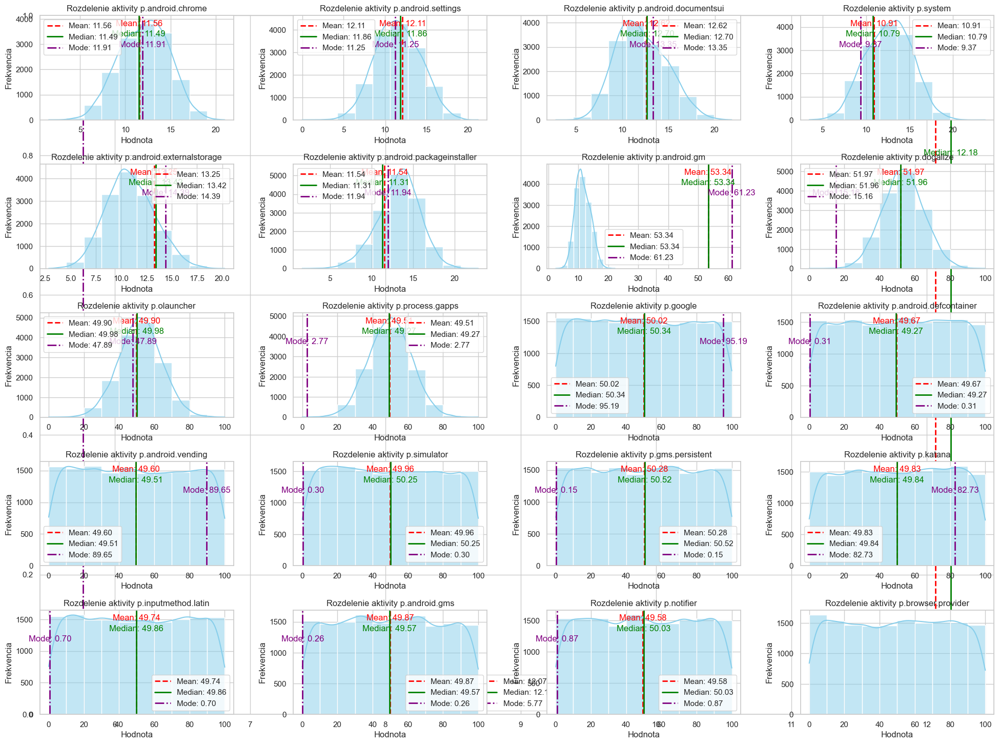

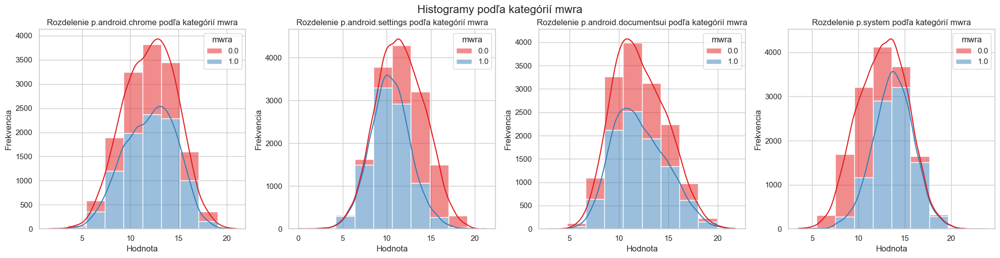

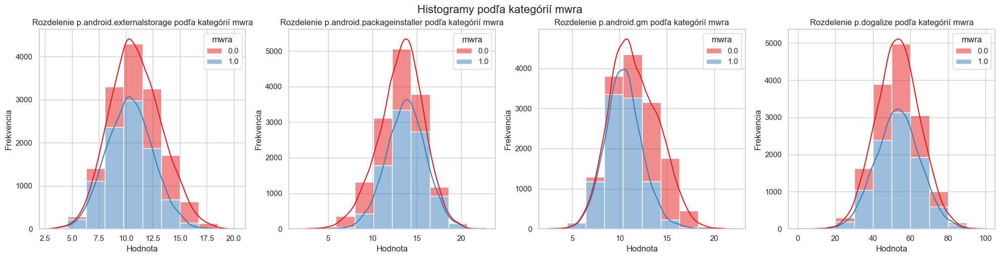

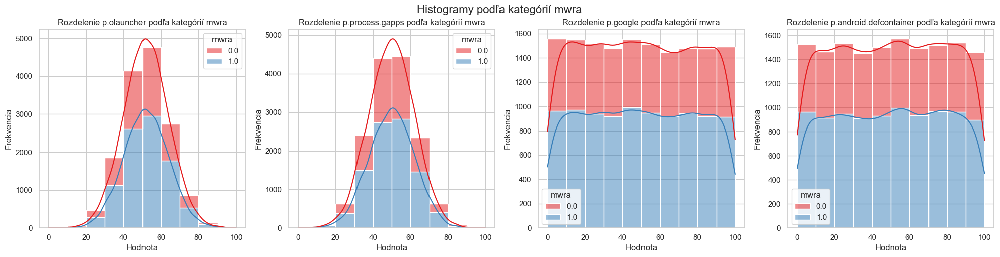

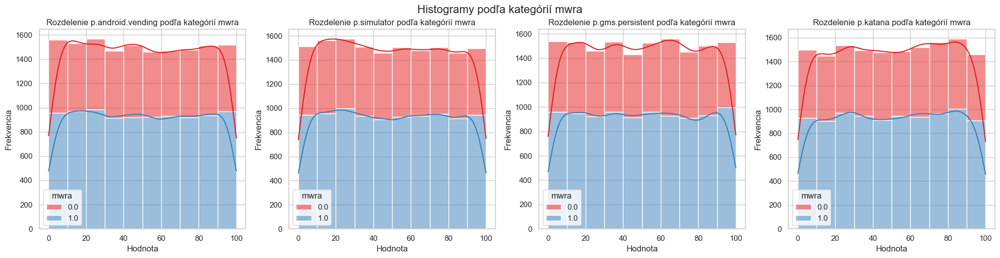

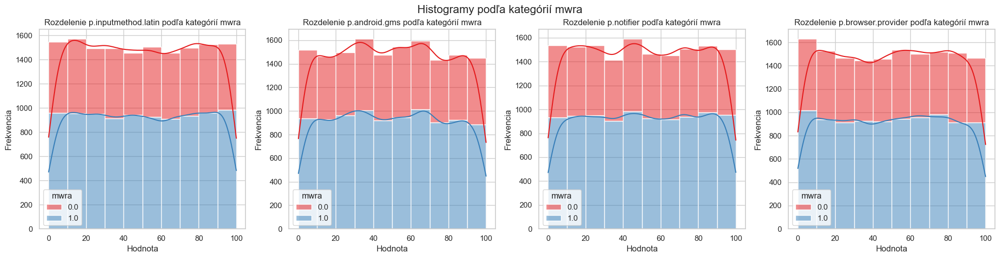

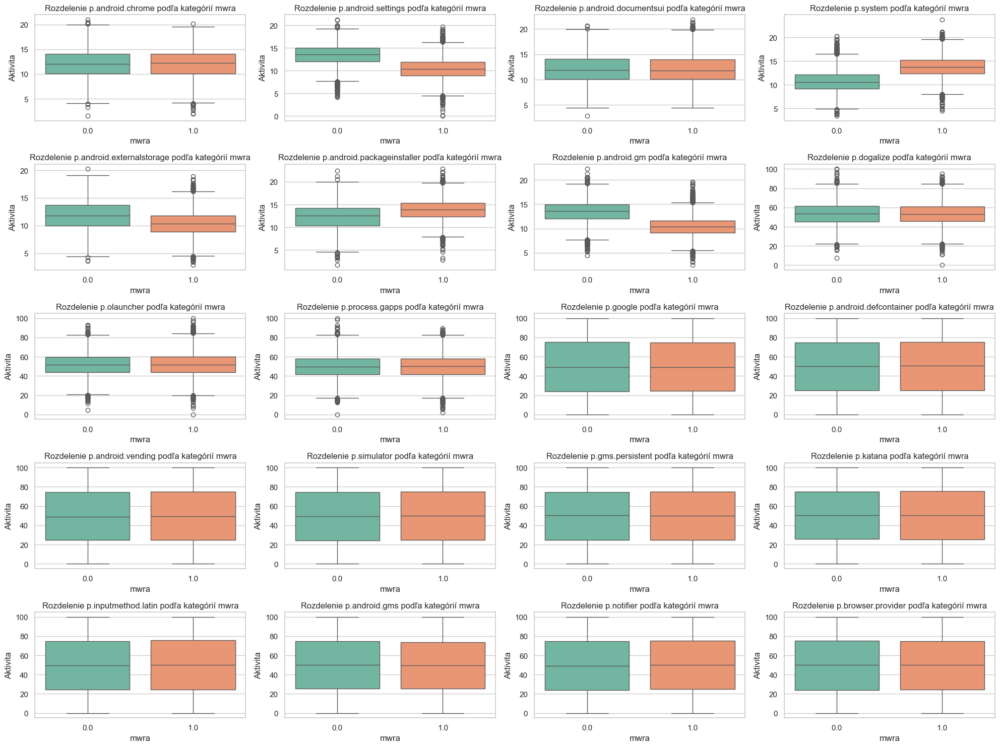

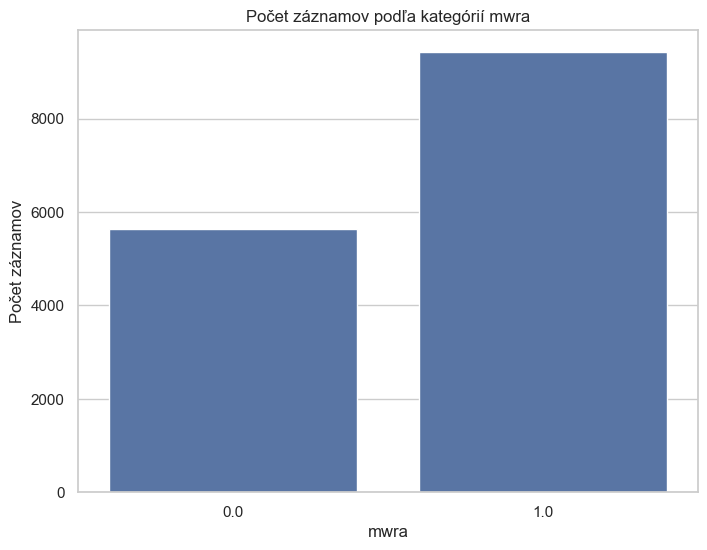

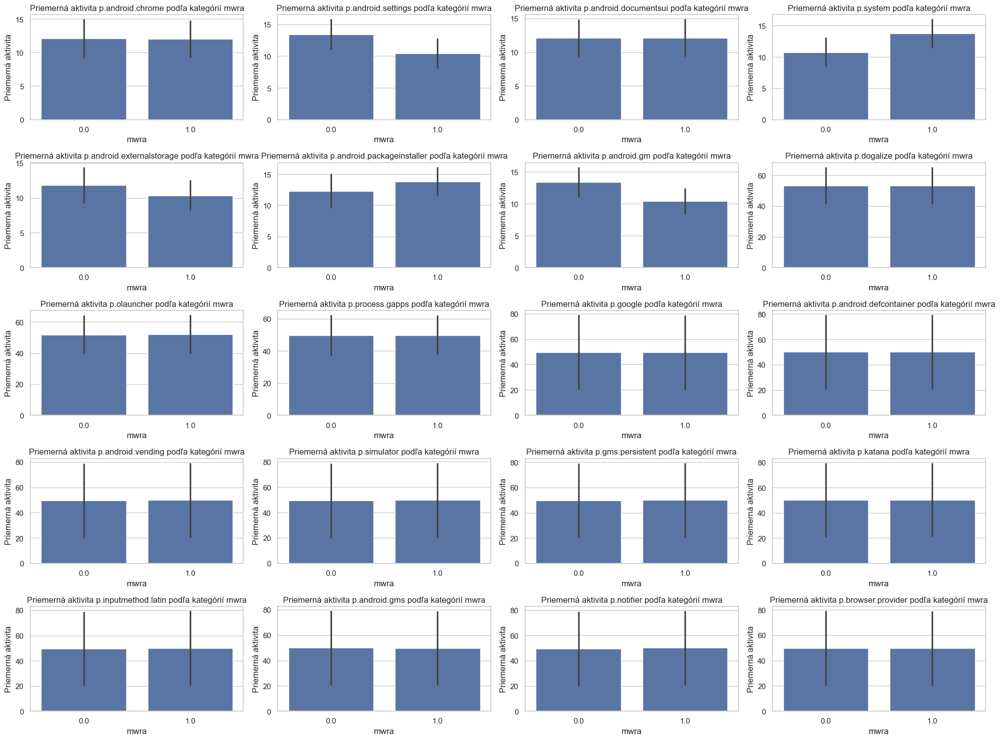

In [10]:
def analyze_processes(df):
    apps = [
        'p.android.chrome', 'p.android.settings', 'p.android.documentsui',
        'p.system', 'p.android.externalstorage', 'p.android.packageinstaller',
        'p.android.gm', 'p.dogalize', 'p.olauncher', 'p.process.gapps',
        'p.google', 'p.android.defcontainer', 'p.android.vending',
        'p.simulator', 'p.gms.persistent', 'p.katana', 'p.inputmethod.latin',
        'p.android.gms', 'p.notifier', 'p.browser.provider'
    ]

    # 1. Histogramy
    plt.figure(figsize=(20, 15))
    for i, app in enumerate(apps, 1):
        # Calculate statistics
        mean_val = df[app].mean()
        median_val = df[app].median()
        mode_val = df[app].mode()[0] 
        
        # Add vertical lines for mean, median, and mode
        plt.axvline(mean_val, color='red', linestyle='--', linewidth=2, label=f'Mean: {mean_val:.2f}')
        plt.axvline(median_val, color='green', linestyle='-', linewidth=2, label=f'Median: {median_val:.2f}')
        plt.axvline(mode_val, color='purple', linestyle='-.', linewidth=2, label=f'Mode: {mode_val:.2f}')
        
        # Add labels for mean, median, and mode
        plt.text(mean_val, plt.gca().get_ylim()[1] * 0.9, f'Mean: {mean_val:.2f}', color='red', ha='center')
        plt.text(median_val, plt.gca().get_ylim()[1] * 0.8, f'Median: {median_val:.2f}', color='green', ha='center')
        plt.text(mode_val, plt.gca().get_ylim()[1] * 0.7, f'Mode: {mode_val:.2f}', color='purple', ha='center')
        plt.legend()
        
        plt.subplot(5, 4, i)  # Zvýšil počet riadkov a stĺpcov
        sns.histplot(df[app], bins=10, kde=True, color='skyblue')
        plt.title(f'Rozdelenie aktivity {app}')
        plt.xlabel('Hodnota')
        plt.ylabel('Frekvencia')
    plt.tight_layout()
    plt.show()

    # 2. Histogramy podľa kategórií mwra 
    apps_per_fig = 4
    for start in range(0, len(apps), apps_per_fig):
        subset_apps = apps[start:start + apps_per_fig]
        num_subset = len(subset_apps)
        cols_subset = 4
        rows_subset = math.ceil(num_subset / cols_subset)
        
        fig_hist_mwra, axes_hist_mwra = plt.subplots(rows_subset, cols_subset, figsize=(20, 5 * rows_subset))
        axes_hist_mwra = axes_hist_mwra.flatten()
        
        for i, app in enumerate(subset_apps):
            sns.histplot(
                data=df, x=app, bins=10, kde=True, palette='Set1', multiple='stack', ax=axes_hist_mwra[i], hue='mwra'
            )
            axes_hist_mwra[i].set_title(f'Rozdelenie {app} podľa kategórií mwra')
            axes_hist_mwra[i].set_xlabel('Hodnota')
            axes_hist_mwra[i].set_ylabel('Frekvencia')
            handles, labels = axes_hist_mwra[i].get_legend_handles_labels()
            if handles:
                axes_hist_mwra[i].legend(title='mwra')
        
        # Odstránenie prázdnych podgrafov, ak existujú
        for j in range(num_subset, len(axes_hist_mwra)):
            fig_hist_mwra.delaxes(axes_hist_mwra[j])
        
        fig_hist_mwra.tight_layout()
        fig_hist_mwra.suptitle('Histogramy podľa kategórií mwra', fontsize=16, y=1.02)
        plt.show()
        plt.close(fig_hist_mwra)
    
    # 3. Krabicové diagramy
    plt.figure(figsize=(20, 15))
    for i, app in enumerate(apps, 1):
        plt.subplot(5, 4, i)
        sns.boxplot(
            x='mwra', y=app, hue='mwra', data=df, palette='Set2', dodge=False
        )
        plt.title(f'Rozdelenie {app} podľa kategórií mwra')
        plt.xlabel('mwra')
        plt.ylabel('Aktivita')
        plt.legend([], [], frameon=False)  # Skryť legendu pre čistejší graf
    plt.tight_layout()
    plt.show()

    # 4. Stĺpcové grafy počtu záznamov
    plt.figure(figsize=(8, 6))
    sns.countplot(x='mwra', data=df)
    plt.title('Počet záznamov podľa kategórií mwra')
    plt.xlabel('mwra')
    plt.ylabel('Počet záznamov')
    plt.show()


    # 6. Stĺpcové grafy porovnania
    plt.figure(figsize=(20, 15))
    for i, app in enumerate(apps, 1):
        plt.subplot(5, 4, i)
        sns.barplot(x='mwra', y=app, data=df, errorbar='sd')  # Nahradenie ci za errorbar
        plt.title(f'Priemerná aktivita {app} podľa kategórií mwra')
        plt.xlabel('mwra')
        plt.ylabel('Priemerná aktivita')
    plt.tight_layout()
    plt.show()

analyze_processes(df_proc)


Výsledky histogramu:

p.android.chrome, p.android.settings, p.android.documentsui, p.system:
Tieto histogramy majú normálnu distribúciu s vrcholom aktivity okolo priemerných hodnôt (približne 10-15).
Procesy sú spojené so základnými funkciami systému a to môže vysvetliť normálne rozdelenie aktivity.
p.android.externalstorage, p.android.packageinstaller, p.android.gm:

Tieto procesy tiež vykazujú normálne rozdelenie aktivít, čo naznačuje rovnomernejšie rozdelenie týchto služieb. Špičková aktivita je v rozmedzí od 10 do 15.
p.dogalize, p.olauncher, p.process.gapps:



p.dogalize a p.process.gapps majú nezvyčajné distribúcie s vysokou aktivitou v rozsahu 40–60 pre p.olauncher, čo môže naznačovať špecifické správanie týchto procesov.
p.android.vending, p.simulator, p.gms.persistent:

Činnosť týchto procesov je rovnomernejšia v celom rozsahu hodnôt. To naznačuje rôznorodosť použitia, kde v určitej oblasti nie je jasný vrchol aktivity, čo môže naznačovať aktivitu na pozadí nezávislú od akcií používateľa.
p.katana, p.android.gms, p.inputmethod.latin:

Tieto procesy vykazujú podobnú distribúciu s viacerými pozorovaniami pri vysokých hodnotách aktivity. Môže to byť preto, že sa často používajú alebo sú súčasťou systémových funkcií.


p.notifier, p.browser.provider:
Tieto procesy majú podobnú distribúciu, pričom aktivita je rovnomernejšie rozložená v rámci rozsahu hodnôt.


Všeobecný záver:
Väčšina procesov vykazuje normálnu distribúciu aktivity, ktorá je typická pre systémové procesy alebo aplikácie na pozadí.
Niektoré procesy, ako napríklad p.dogalize, majú atypické rozdelenie, čo môže naznačovať špecifické správanie alebo použitie týchto procesov.
Procesy spojené s kľúčovými systémovými funkciami alebo často používanými aplikáciami (napríklad p.android.chrome a p.android.gms) majú výraznejšie vrcholy aktivity.



Výsledky histogramu týkajúce sa mvra:

Histogramy normálneho rozdelenia (systémové procesy):

p.android.chrome, p.android.settings, p.android.documentsui, p.system:
Histogramy pre kategórie mwra 0,0 (modrá) a 1,0 (červená) sú takmer totožné. Tieto procesy vykazujú normálnu distribúciu aktivity s vrcholmi okolo priemerných hodnôt (10-15) a medzi kategóriami mwra nie je takmer žiadny rozdiel.
Histogramy s miernymi rozdielmi:

p.android.externalstorage, p.android.gm, p.android.packageinstaller:
Tieto procesy majú výraznejšie rozdiely medzi kategóriami mwra. Napríklad pre p.android.externalstorage kategória mwra 1.0 (červená) vykazuje väčšiu aktivitu v strednom rozsahu (10-15) ako mwra 0.0 (modrá). Rozdiely sú však stále nepatrné a celkový tvar rozloženia zostáva normálny.
Procesy s viditeľnými rozdielmi:

p.dogalize:
Táto aplikácia ukazuje viditeľné rozdiely medzi kategóriami mwra. Pre mwra 0,0 je aktivita sústredená v rozsahu 0-50, zatiaľ čo pre mwra 1,0 je aktivita distribuovaná v rozsahu 0-100.
p.olauncher, p.process.gapps:
Oba procesy majú mierne rozdiely v distribúcii medzi kategóriami mwra. Červené a modré histogramy sa prekrývajú, ale pre mwra 1.0 je aktivita o niečo vyššia v strednej časti rozsahu.
Procesy s rovnomernou distribúciou:

p.android.vending, p.simulator, p.gms.persistent, p.katana:
Tieto procesy majú rovnomerné rozloženie v celom rozsahu činnosti. Histogramy pre obe kategórie mwra sú takmer totožné a aktivita je rovnomerne rozdelená medzi obe skupiny používateľov.
Minimálne rozdiely:

p.inputmethod.latin, p.notifier, p.browser.provider:
Pre tieto procesy neexistujú prakticky žiadne rozdiely medzi mwra 0,0 a mwra 1,0. Oba súbory údajov ukazujú rovnomerné rozdelenie aktivity.

Všeobecné závery:
Vo väčšine prípadov je distribúcia aktivity medzi kategóriami mwra (0,0 a 1,0) veľmi podobná, čo naznačuje, že medzi týmito dvoma skupinami nie sú žiadne významné rozdiely.
Len niekoľko procesov, ako napríklad p.dogalize, vykazuje významné rozdiely v aktivite medzi kategóriami mwra.
Procesy spojené so systémovými funkciami, ako napríklad p.android.chrome a p.android.settings, majú normálne rozdelenie aktivity, ktoré je typické pre systémové procesy.



Zhrnutie krabicových grafov:


Procesy s normálnou distribúciou:
p.android.chrome, p.android.settings, p.android.documentsui, p.system, p.android.gm:
Pre tieto procesy označujú boxy whisker podobné distribúcie pre kategórie mwra 0,0 a 1,0. Mediány sú približne v rovnakom bode a rozsah údajov medzi kvartilmi je tiež takmer rovnaký. Počet emisií je malý, čo naznačuje stabilné rozdelenie aktivity.
Postupy s malými rozdielmi:

p.android.externalstorage, p.android.packageinstaller, p.dogalize:
Pre tieto procesy existujú menšie rozdiely medzi kategóriami mwra. Napríklad p.dogalize má vyššiu strednú aktivitu pre mwra 1,0 ako pre mwra 0,0. To môže naznačovať, že kategória mwra 1.0 je v tejto aplikácii aktívnejšia. Existuje aj niekoľko odľahlých hodnôt, najmä pre mwra 1.0.

Procesy s rovnomernou distribúciou:
p.android.vending, p.simulator, p.gms.persistent, p.katana:
Tieto procesy vykazujú takmer identické distribúcie pre obe kategórie mwra. Mediány a rozsahy údajov sú takmer rovnaké. Malý počet odľahlých hodnôt tiež naznačuje, že údaje v týchto kategóriách nie sú výrazne odľahlé.
Procesy s výraznejšími rozdielmi:

p.google, p.android.defcontainer, p.process.gapps:
V týchto procesoch je rozsah údajov pre mwra 1,0 výrazne väčší ako pre mwra 0,0, čo môže naznačovať rôznorodejšiu aktivitu pre túto kategóriu. Napríklad p.google má vyšší medián pre mwra 1.0 ako pre mwra 0.0 a v oboch kategóriách sú aj odľahlé hodnoty.
Procesy s emisiami:

p.olauncher, p.process.gapps:
Tieto procesy majú značné množstvo emisií, najmä pre kategóriu mwra 0,0. To môže naznačovať, že v tejto kategórii existujú jednotliví používatelia s veľmi odlišnou aktivitou.

Všeobecné závery:
Pre väčšinu procesov je distribúcia aktivity medzi kategóriami mwra (0,0 a 1,0) veľmi podobná. Mediány a kvartily naznačujú, že rozdiely v aktivite sú minimálne.
Pri procesoch ako p.dogalize a p.google však možno vidieť menšie rozdiely medzi kategóriami, ktoré môžu naznačovať rozdielne úrovne aktivity medzi týmito dvoma skupinami.
Odľahlé hodnoty, najmä pre procesy ako p.olauncher a p.process.gapps, naznačujú prítomnosť jednotlivých používateľov s nezvyčajne vysokou alebo nízkou aktivitou.


Počet výsledkov grafu:

Stĺpcový graf zobrazuje rozdelenie záznamov podľa kategórie mwra (0,0 a 1,0).
Tu môžete vidieť, že v kategórii mwra 1.0 (~9000) je viac záznamov ako v kategórii mwra 0.0 (~7000).
To naznačuje, že existuje viac používateľov spadajúcich do kategórie mwra 1.0 v porovnaní s mwra 0.0.
Diagramy priemerných hodnôt aktivity procesov pre obe kategórie mwra.


p.android.chrome, p.android.settings, p.android.documentsui, p.system:
Priemerné hodnoty aktivity pre kategórie mwra 0,0 a mwra 1,0 sú takmer rovnaké. To znamená, že medzi kategóriami nie sú rozdiely v aktivite týchto procesov.

p.dogalize:
Tu je jasný rozdiel. Priemerná aktivita v kategórii mwra 1.0 je vyššia ako v kategórii mwra 0.0, čo naznačuje aktívnejšie využitie tohto procesu v kategórii mwra 1.0.

p.android.externalstorage, p.android.packageinstaller, p.android.gm:
Priemerné hodnoty aktivity pre obe kategórie sú tiež veľmi podobné, čo naznačuje, že medzi kategóriami mwra nie sú žiadne významné rozdiely.
Procesy s minimálnymi rozdielmi:

p.olauncher, p.process.gapps, p.google:
Hoci rozdiely medzi kategóriami mwra sú minimálne, kategórie mwra 1.0 vykazujú mierne vyššiu priemernú aktivitu.
Procesy s jednotnou aktivitou:

p.android.vending, p.simulator, p.gms.persistent:
Priemerné hodnoty aktivity sú rovnaké pre obe kategórie mwra, čo naznačuje, že aktivita v týchto procesoch je nezávislá od kategórie mwra.
Priemerné chyby (chybové pruhy):

Čierne zvislé čiary predstavujúce chyby priemeru ukazujú, že v údajoch je malý rozptyl okolo priemeru, čo naznačuje, že tieto odhady sú stabilné.


Všeobecný záver:
Vo väčšine procesov je aktivita medzi kategóriami mwra 0,0 a mwra 1,0 prakticky rovnaká.
Niektoré procesy, ako napríklad p.dogalize, vykazujú vyššiu aktivitu pre kategóriu mwra 1.0, čo môže naznačovať špecifické správanie pre túto skupinu.
Celkovo sú rozdiely v aktivite medzi kategóriami mwra minimálne, čo dokazujú podobné priemery a malé chyby priemeru.

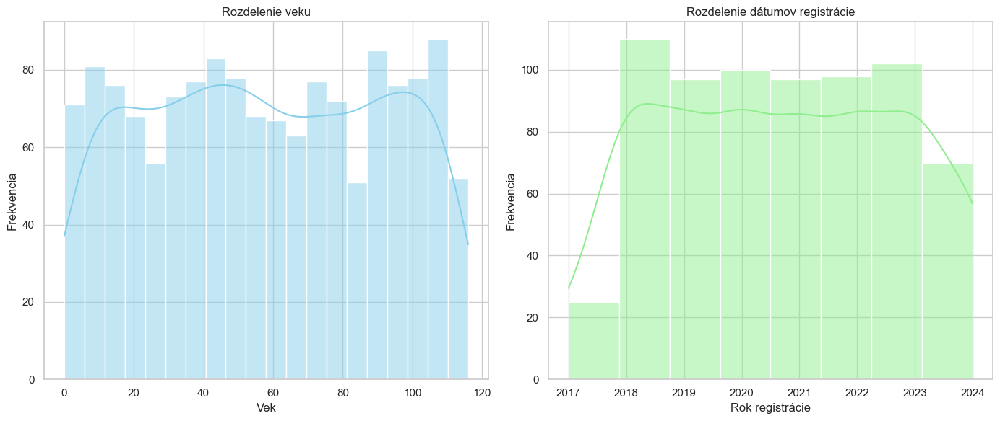

In [11]:
def analyze_profiles(df):
    # Prevedieme dátumy do formátu datetime
    df['registration'] = pd.to_datetime(df['registration'], errors='coerce')
    df['birthdate'] = pd.to_datetime(df['birthdate'], errors='coerce')

    # Vypočítame vek
    df['age'] = (datetime.datetime.now() - df['birthdate']).dt.days // 365

    # 1. Histogramy pre vek a dátumy registrácie
    plt.figure(figsize=(14, 6))

    # Histogram pre vek
    plt.subplot(1, 2, 1)
    sns.histplot(df['age'], bins=20, kde=True, color='skyblue')
    plt.title('Rozdelenie veku')
    plt.xlabel('Vek')
    plt.ylabel('Frekvencia')

    # Histogram pre dátumy registrácie
    plt.subplot(1, 2, 2)
    sns.histplot(df['registration'].dt.year, bins=df['registration'].dt.year.nunique(), kde=True, color='lightgreen')
    plt.title('Rozdelenie dátumov registrácie')
    plt.xlabel('Rok registrácie')
    plt.ylabel('Frekvencia')

    plt.tight_layout()
    plt.show()

analyze_profiles(df_prof)


Výsledky histogramu:

"Vekové rozdelenie".
Stĺpce zobrazujú rozdelenie ľudí podľa veku. Je vidieť, že frekvencia je rozložená pomerne rovnomerne pre vekové skupiny do 80 rokov s menšími výkyvmi.
Frekvencia vrcholí vo vekových skupinách okolo 40-60 rokov, čo znamená, že táto veková kategória obsahuje najväčší počet prihlásených.
Histogram je doplnený o krivku hustoty distribúcie, ktorá ukazuje všeobecné „správanie“ údajov – je vidieť, že po vrchole približne 50 rokov frekvencia mierne klesá.
Veková skupina od 0 do 10 rokov má dosť nízky počet vstupov a po 80 rokoch aj frekvencia prudko klesá.

"Rozdelenie dátumov registrácie."
Stĺpce zobrazujú počet registrácií používateľov v rôznych rokoch. Je vidieť, že počet registrácií je od roku 2017 vysoký a najvyšší počet registrácií bol medzi rokmi 2018 a 2023, pričom zostáva relatívne stabilný.
V roku 2024 (nedokončený rok) je viditeľný pokles počtu registrácií, čo je logické, keďže tento rok ešte nie je ukončený.
Histogram je doplnený aj o krivku hustoty, ktorá ukazuje stabilný počet registrácií medzi rokmi 2018 a 2023.

Všeobecný záver:
Prvý graf: ukazuje, že väčšina údajov je sústredená vo vekovej skupine 40 – 60 rokov, čo môže naznačovať určité demografické údaje používateľov.
Druhý graf: Ukazuje, že najvyšší počet používateľov sa zaregistroval od roku 2018 do roku 2023, čo môže naznačovať nárast popularity alebo aktivity počas tohto obdobia.

V tvare krabice:
Údaje nemôžeme analyzovať, pretože sú to objekty (problém vyriešime v priebehu úlohy)


Stĺpcové grafy:
Údaje nemôžeme analyzovať, pretože sú to objekty


1.1 C:

In [12]:
def C1b(x):
    name, df = list(datasets.items())[x]
    print(f'Pairing Analysis for "{name}" dataset')

    numeric_columns = df.select_dtypes(include=['float64', 'int64']).columns
    numeric_columns = [col for col in numeric_columns if 'imei' not in col]

    if numeric_columns:
        corr_matrix = df[numeric_columns].corr()
        if len(numeric_columns) > 1:
            plt.figure(figsize=(25, 18))
            sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
            plt.title(f'Pearson Correlation Heatmap for {name}')
            plt.savefig(f'../plots/C/pearson_heat_map_{name}.png')
            plt.show()
    else:
        print(f"No numeric columns to analyze for {name}")

Poďme analyzovať tepelné mapy pre každý súbor údajov, aby sme videli závislé údaje s vysokou koreláciou

Pairing Analysis for "Connections" dataset


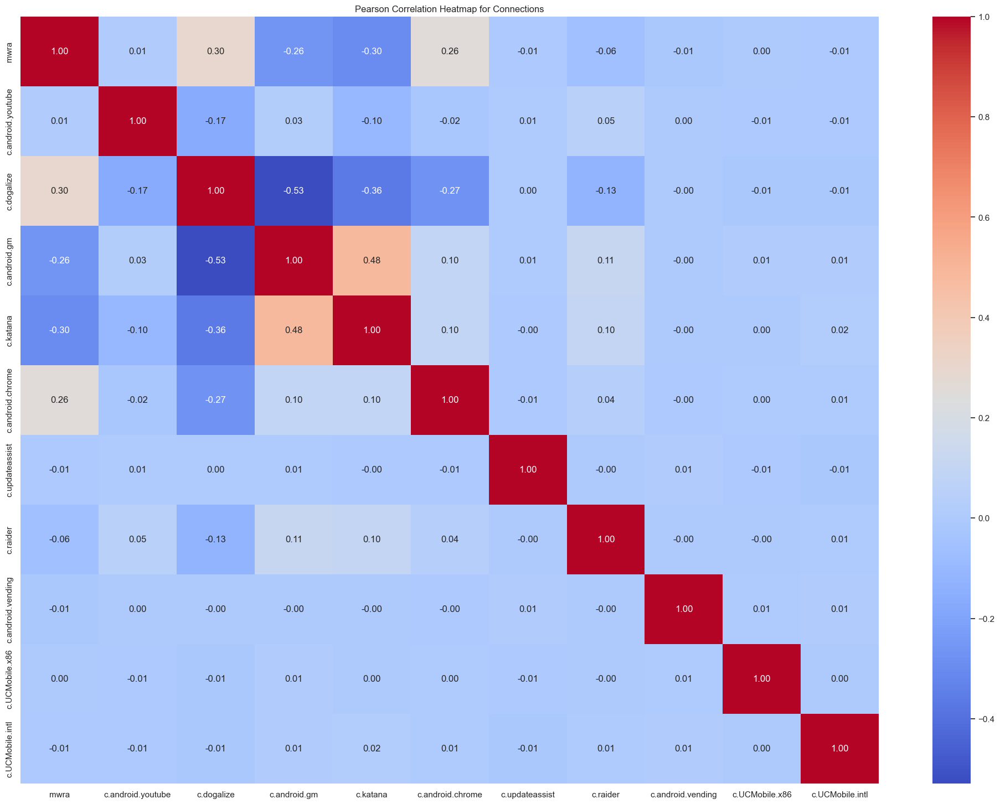

In [13]:
C1b(0)

Hlavné páry vysoko korelovaných premenných sú:
c.android.gm a c.katana: korelácia je 0,48, čo je stredne pozitívna korelácia. To znamená, že aktivita v službách Gmail (c.android.gm) a Facebook (c.katana) mierne koreluje – používatelia, ktorí aktívne používajú jednu z týchto aplikácií, často používajú aj druhú.
mwra a c.dogalize: korelácia je 0,30, čo je tiež mierna pozitívna korelácia. To naznačuje, že premenná mwra (pravdepodobne demografický alebo behaviorálny faktor) má niečo spoločné s používaním aplikácie Dogalize.

Negatívna korelácia:
c.dogalize a c.android.gm: korelácia je -0,53, čo naznačuje stredne silný negatívny vzťah medzi týmito premennými. To znamená, že nároční používatelia Gmailu budú menej pravdepodobne používať aplikáciu Dogalize.
c.dogalize a c.katana: korelácia -0,36 - slabý negatívny vzťah medzi Dogalize a Facebook (katana). To znamená, že používatelia jednej aplikácie sú menej aktívni v inej.

Slabé korelácie:
Pre väčšinu ostatných premenných sú korelácie buď veľmi nízke alebo blízke nule, čo naznačuje slabý alebo žiadny lineárny vzťah medzi nimi. Napríklad korelácia medzi c.android.vending a väčšinou ostatných aplikácií je takmer nulová, čo naznačuje, že aktivita Obchodu Play je nezávislá od iných aplikácií.

Tepelná mapa ukazuje, že:
Existuje niekoľko premenných so stredne silnými koreláciami (napríklad medzi Gmailom a Facebookom).
Niektoré aplikácie majú negatívnu koreláciu, čo naznačuje, že nároční používatelia jednej aplikácie môžu s menšou pravdepodobnosťou používať inú (napr. Dogalize a Gmail).
Väčšina premenných nevykazuje silné lineárne vzťahy, čo môže naznačovať, že aktivita používateľov v týchto aplikáciách je od seba nezávislá.

Pairing Analysis for "Devices" dataset


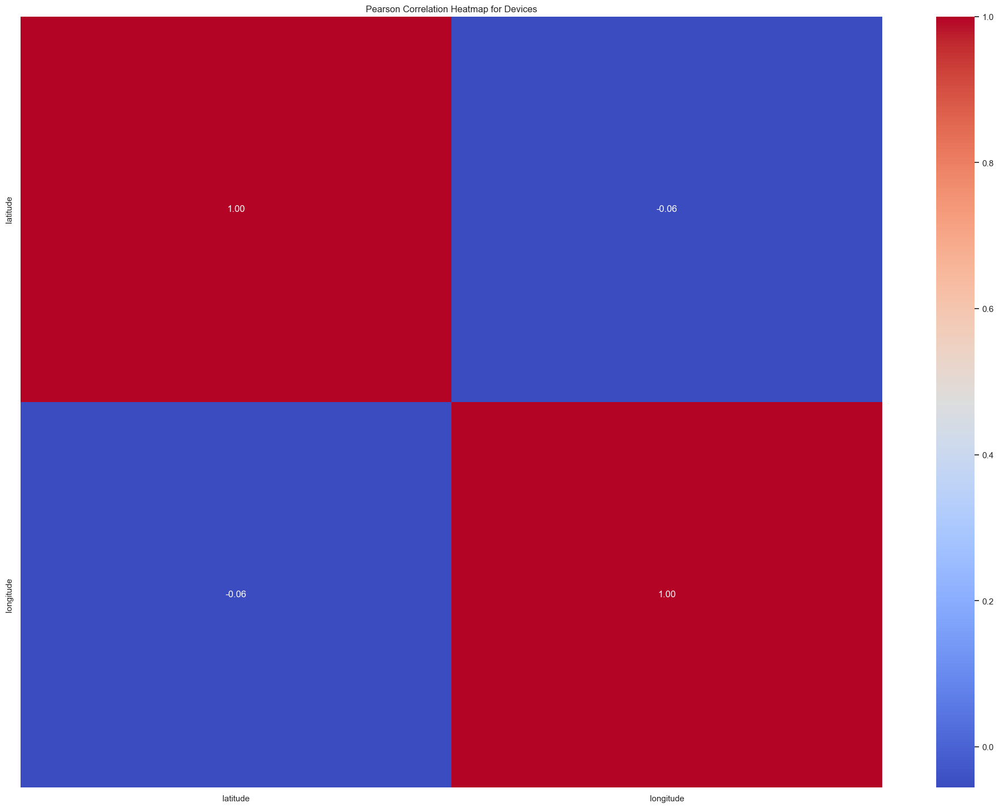

In [14]:
C1b(1)

Korelácia medzi zemepisnou šírkou a dĺžkou:
Hodnota je -0,06, čo naznačuje slabú negatívnu koreláciu medzi zemepisnou šírkou a dĺžkou.
To znamená, že medzi týmito geografickými súradnicami neexistuje takmer žiadny lineárny vzťah.
To znamená, že zmena zemepisnej šírky nemá významný vplyv na zemepisnú dĺžku a naopak.

Pairing Analysis for "Processes" dataset


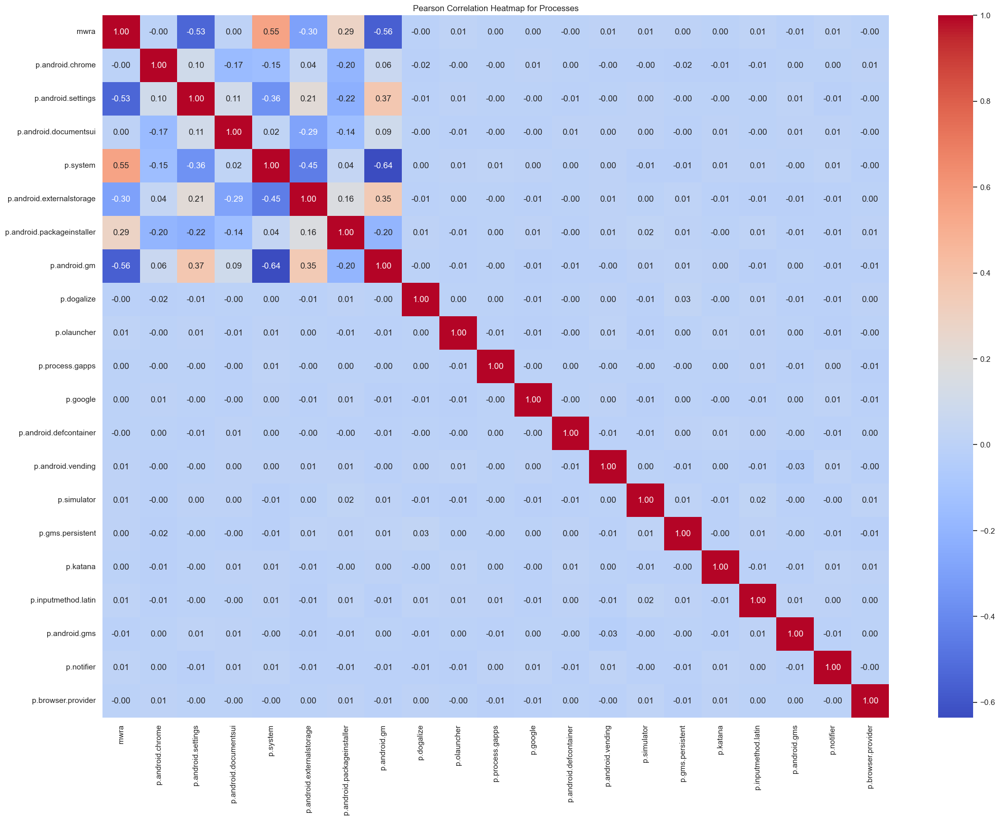

In [15]:
C1b(2)

Kľúčové body analýzy:

Vysoké korelácie:
p.android.documentsui a p.android.settings: korelácia 0,37, čo naznačuje mierny pozitívny vzťah medzi týmito procesmi.
p.system a p.android.documentsui: Korelácia 0,45 je najvyššia korelácia medzi procesmi, čo naznačuje silné prepojenie medzi systémovými procesmi a dokumentmi systému Android.
p.android.gms a p.android.gm: Korelácia 0,64 je pomerne vysoká korelácia, ktorá ukazuje úzky vzťah medzi službami Google Play (GMS) a Gmailom.
p.android.packagemanager a p.android.gm: korelácia 0,43, čo tiež naznačuje úzky vzťah medzi procesom inštalácie balíka a e-mailovým klientom.

Negatívne korelácie:
mwra a p.android.settings: korelácia -0,53, čo znamená významný negatívny vzťah medzi premennou mwra a procesmi nastavenia systému Android. To naznačuje, že keď sa aktivita premennej mwra zvyšuje, aktivita v nastaveniach sa môže znižovať.
p.android.documentsui a p.android.gm: korelácia -0,36, čo naznačuje negatívny vzťah medzi procesmi dokumentov a službou Gmail.

Korelácie blízke nule:
Pre väčšinu procesov, ako sú p.google a p.dogalize, sú korelácie veľmi nízke alebo chýbajú, čo naznačuje, že tieto procesy sú od seba nezávislé.

mwra korelácie:
Premenná mwra má stredne silnú pozitívnu koreláciu s p.system (0,55) a p.android.externalstorage (0,30), čo môže naznačovať, že so zvyšujúcou sa aktivitou mwra sa zvyšuje aj aktivita v systémových procesoch a externom úložisku.

Všeobecné závery:
Tepelná mapa ukazuje, že procesy Android majú medzi sebou pozitívne aj negatívne korelácie. Predovšetkým systémové procesy a procesy súvisiace so spoločnosťou Google majú medzi sebou silné prepojenie. Niektoré procesy, ako sú nastavenia a dokumenty, majú negatívne korelácie s inými, čo môže naznačovať oddelenie funkčných oblastí použitia.

Pairing Analysis for "Profiles" dataset


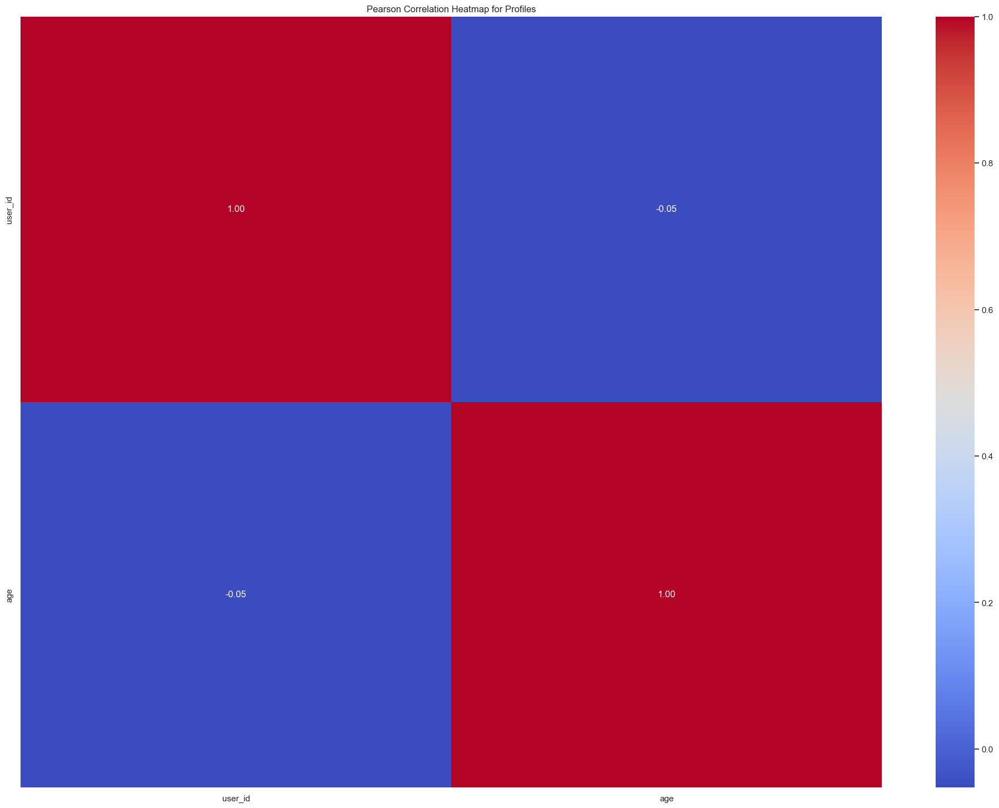

In [16]:
C1b(3)

Korelácia medzi user_id a vekom:
Hodnota je -0,05, čo naznačuje veľmi slabú negatívnu koreláciu medzi ID používateľa a vekom. To znamená, že medzi týmito premennými neexistuje takmer žiadna závislosť a vek používateľov nesúvisí s ich ID. Táto slabá korelácia môže byť spôsobená náhodou, pretože hodnota je veľmi blízka nule.
Záver:
V tejto analýze môžeme dospieť k záveru, že premenné user_id a age sú na sebe prakticky nezávislé, čo sa očakáva, pretože ID používateľov a ich vek by nemali byť v korelácii.

1.1 D:

In [17]:
def D_conn(df):
    #Correlation between mwra & predictions
    df_numeric = df.select_dtypes(include=['float'])
    corr_matrix = df_numeric.corr()
    
    mwra_corr = corr_matrix['mwra'].sort_values(ascending=False)
    print("Korelácia s mwra::")
    print(mwra_corr)
    
D_conn(df_conn)

Korelácia s mwra::
mwra                 1.000000
c.dogalize           0.297159
c.android.chrome     0.256803
c.android.youtube    0.010822
c.UCMobile.x86       0.001940
c.UCMobile.intl     -0.007424
c.updateassist      -0.008046
c.android.vending   -0.010325
c.raider            -0.058482
c.android.gm        -0.264992
c.katana            -0.300643
Name: mwra, dtype: float64


Devices nemá zmysel rozoberať, pretože neexistuje žiadna významná korelácia

In [18]:
def D_proc(df):
    df_numeric = df.select_dtypes(include=['float', 'int'])
    corr_matrix = df_numeric.corr()

    mwra_corr = corr_matrix['mwra'].sort_values(ascending=False)
    print("Corelacia parametrov z mwra:")
    print(mwra_corr)
    
D_proc(df_proc)

Corelacia parametrov z mwra:
mwra                          1.000000
p.system                      0.546412
p.android.packageinstaller    0.287509
p.notifier                    0.013381
p.inputmethod.latin           0.011044
p.olauncher                   0.009763
p.android.vending             0.006643
p.simulator                   0.006161
p.gms.persistent              0.004058
p.android.documentsui         0.003163
p.google                      0.001144
p.process.gapps               0.000557
p.katana                      0.000194
p.android.defcontainer       -0.000210
imei                         -0.000512
p.browser.provider           -0.000553
p.android.chrome             -0.001738
p.dogalize                   -0.004594
p.android.gms                -0.005287
p.android.externalstorage    -0.295212
p.android.settings           -0.534300
p.android.gm                 -0.564367
Name: mwra, dtype: float64


Profiles nemá zmysel rozoberať, pretože neexistuje žiadna významná korelácia

1.1 E:

Prvotné zamyslenie k riešeniu zadania projektu:

Od ktorých atribútov závisí predikovaná premenná?  
Predikovaná premenná závisí od rôznych atribútov, ktoré sú analyzované v texte. Napríklad, aktivita používateľov v rôznych aplikáciách (ako c.android.youtube, c.android.chrome, c.android.gm, c.katana, atď.) a demografické faktory (ako mwra) sú kľúčové atribúty, ktoré ovplyvňujú predikovanú premennú.

Je potrebné kombinovať záznamy z viacerých súborov?
Áno, je potrebné kombinovať záznamy z viacerých súborov. Text naznačuje, že rôzne súbory obsahujú rôzne typy údajov, ktoré sú relevantné pre analýzu. Napríklad, súbory obsahujúce údaje o aktivitách používateľov v rôznych aplikáciách, demografické údaje a geografické údaje by mali byť kombinované, aby sa získal komplexný pohľad na vzťahy medzi premennými a predikovanou premennou.

sú niektoré atribúty medzi sebou závislé?
Áno, z analýzy korelácie medzi rôznymi atribútmi vyplýva, že niektoré atribúty sú medzi sebou závislé. Tu sú niektoré kľúčové závislosti:

1. Pozitívne korelácie:
   - `c.android.gm` a `c.katana`: Korelácia je 0.48, čo naznačuje stredne pozitívny vzťah medzi aktivitou v aplikáciách Gmail a Facebook.
   - `p.android.gms` a `p.android.gm`: Korelácia 0.64, čo ukazuje úzky vzťah medzi službami Google Play a Gmailom.

2. Negatívne korelácie:
   - `c.dogalize` a `c.android.gm`: Korelácia -0.53, čo naznačuje stredne silný negatívny vzťah medzi týmito premennými.
   - `mwra` a `p.android.settings`: Korelácia -0.53, čo znamená významný negatívny vzťah medzi premennou `mwra` a procesmi nastavenia systému Android.

3. Slabé korelácie:
   - Väčšina ostatných premenných má veľmi nízke alebo takmer nulové korelácie, čo naznačuje slabý alebo žiadny lineárny vzťah medzi nimi.







Identifikácia problémov, integrácia a čistenie dát

1.2 A:

In [19]:
def reformat_file(file_path):
    # Krok 1: Čítanie TSV súboru so správnym oddeľovačom
    try:
        df = pd.read_csv(file_path, sep='\t', on_bad_lines='warn', engine='python')
    except Exception as e:
        print(f"Chyba pri čítaní súboru: {e}")
        return

    # Krok 2: Vyplnenie chýbajúcich hodnôt NaN
    df.fillna(value=np.nan, inplace=True)

    # Krok 3: Určenie šírky stĺpcov na základe maximálnej dĺžky obsahu a nadpisu
    column_widths = [max(df[col].astype(str).map(len).max(), len(col)) for col in df.columns]

    # Krok 4: Prepísanie toho istého súboru s vyrovnaním stĺpcov
    try:
        with open(file_path, 'w', encoding='utf-8') as outfile:
            # Formátovanie nadpisov s vyrovnaním
            formatted_header = "\t".join(header.ljust(column_widths[i]) for i, header in enumerate(df.columns))
            outfile.write(formatted_header + '\n')

            # Formátovanie riadkov dát s vyrovnaním
            for index, row in df.iterrows():
                formatted_row = "\t".join(str(val).ljust(column_widths[i]) for i, val in enumerate(row))
                outfile.write(formatted_row + '\n')

        print(f"Súbor {file_path} bol úspešne naformátovaný a prepísaný.")
    except Exception as e:
        print(f"Chyba pri zapisovaní súboru: {e}")


def save_df(df, output_file):
    df.to_csv(output_file, sep='\t', index=False)


def clean_data_Nan(df, method):
    if method == 1:
        cleaned_df = df.dropna()
        print(f"Vymazané: {len(df) - len(cleaned_df)}")
    elif method == 2:
        for column in df.columns:
            if df[column].isnull().any():
                 if pd.api.types.is_numeric_dtype(df[column]):
                        replacement_value = df[column].mean()
                        df[column] = df[column].fillna(replacement_value)
                        print(f"Hodnota v '{column}' nahradená: {replacement_value}")
                 else:
                        print(f"Stĺpec '{column}' nie je číselný a nebude vyplnený priemernou hodnotou.")
        cleaned_df = df
    else:
        print("Chyba: Neznáma metóda")
        return None
    
    return cleaned_df


def remove_outliers_zscore(df, threshold=3):
    df_cleaned = df.copy()
    
    for column in df_cleaned.select_dtypes(include=[np.number]).columns:
        z_scores = (df_cleaned[column] - df_cleaned[column].mean()) / df_cleaned[column].std()
        df_cleaned = df_cleaned[(np.abs(z_scores) < threshold)]
    
    return df_cleaned


def remove_outliers_iqr(df):
    df_cleaned = df.copy()
    
    for column in df_cleaned.select_dtypes(include=[np.number]).columns:
        Q1 = df_cleaned[column].quantile(0.25)
        Q3 = df_cleaned[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        
        # Výpočet 5% a 95% hraníc
        lower_limit = df_cleaned[column].quantile(0.05)
        upper_limit = df_cleaned[column].quantile(0.95)
        
        # Nahradenie odľahlých hodnôt hranicami rozdelenia
        df_cleaned[column] = np.where(df_cleaned[column] < lower_bound, lower_limit, df_cleaned[column])
        df_cleaned[column] = np.where(df_cleaned[column] > upper_bound, upper_limit, df_cleaned[column])
    
    return df_cleaned


def A2b(x):
    name, df = list(datasets.items())[x]

    if name in ["Connections", "Processes"]:  
        df['ts'] = pd.to_datetime(df['ts'], format='%Y-%m-%d %H:%M:%S', errors='coerce')
        df['ts'] = (df['ts'] - pd.Timestamp("1970-01-01")) // pd.Timedelta('1s')

    
    elif name == "Devices":
        le = LabelEncoder()
        for column in df.select_dtypes(include=['object']).columns:
            df[column] = le.fit_transform(df[column])

    
    elif name == "Profiles":
        formats = [
            "%Y-%m-%d",       
            "%d %b %Y",       
            "%Y/%m/%d",        
            "%m/%d/%Y, %H:%M:%S", 
            "%d %b %Y",        
            "%d/%m/%Y, %H:%M:%S",  
            "%d/%m/%Y",       
            "%b %d %Y",        
            "%Y/%d/%m",        
            "%d/%m/%Y, %H:%M:%S",  
            "%d %B %Y",        
            "%Y-%m-%d",        
            "%m/%d/%Y, %H:%M:%S",  
        ]
        def parse_dates(date_str, formats):
            for fmt in formats:
                try:
                    return pd.to_datetime(date_str, format=fmt)
                except (ValueError, TypeError):
                    continue
            return pd.NaT 
    
        df['registration'] = df['registration'].apply(lambda x: parse_dates(x, formats))
        df['registration'] = (df['registration'] - pd.Timestamp("1970-01-01")) // pd.Timedelta('1s')

        df = df.drop(columns=['job', 'residence', 'birthdate'])
        
        le = LabelEncoder()
        for column in df.select_dtypes(include=['object']).columns:
            df[column] = le.fit_transform(df[column])
            
    return df


In [20]:

# Convert all values to float
processed_df_conn = A2b(0)
save_df(processed_df_conn, '../datasets/024-ver1/connections.csv')
save_df(processed_df_conn, '../datasets/024-ver2/connections.csv')

# Clean all NaN values
clean_data1 = clean_data_Nan(processed_df_conn, 1)
clean_data2 = clean_data_Nan(processed_df_conn, 2)

# Drop duplicates
clean_data1 = clean_data1.drop_duplicates()
clean_data2 = clean_data2.drop_duplicates()

# Drop outliers
clean_data1 = remove_outliers_zscore(clean_data1)
clean_data2 = remove_outliers_iqr(clean_data2)

# Save cleaned data
save_df(clean_data1, '../datasets/024-ver1/connections.csv')
save_df(clean_data2, '../datasets/024-ver2/connections.csv')

reformat_file('../datasets/024-ver1/connections.csv')
reformat_file('../datasets/024-ver2/connections.csv')




Vymazané: 0
Súbor ../datasets/024-ver1/connections.csv bol úspešne naformátovaný a prepísaný.
Súbor ../datasets/024-ver2/connections.csv bol úspešne naformátovaný a prepísaný.


Pôvodne neboli v údajoch žiadne chyby, ale zbavili sme sa odľahlých hodnôt a naformátovali sme ich na údaje (podrobná analýza týchto formátov bude o niečo neskôr)
Stĺpec ts bol naformátovaný v dátovom čase a potom konvertovaný na číselný formát (sekundy)

In [21]:

# Process the devices dataset
processed_df_dev = A2b(1)
save_df(processed_df_dev, '../datasets/024-ver1/devices.csv')
save_df(processed_df_dev, '../datasets/024-ver2/devices.csv')

# Clean all NaN values
clean_data1_dev = clean_data_Nan(processed_df_dev, 1)
clean_data2_dev = clean_data_Nan(processed_df_dev, 2)

# Drop duplicates
clean_data1_dev = clean_data1_dev.drop_duplicates()
clean_data2_dev = clean_data2_dev.drop_duplicates()

# Drop outliers
clean_data1_dev = remove_outliers_zscore(clean_data1_dev)
clean_data2_dev = remove_outliers_iqr(clean_data2_dev)

# Save cleaned data
save_df(clean_data1_dev, '../datasets/024-ver1/devices.csv')
save_df(clean_data2_dev, '../datasets/024-ver2/devices.csv')

reformat_file('../datasets/024-ver1/devices.csv')
reformat_file('../datasets/024-ver2/devices.csv')


Vymazané: 0
Súbor ../datasets/024-ver1/devices.csv bol úspešne naformátovaný a prepísaný.
Súbor ../datasets/024-ver2/devices.csv bol úspešne naformátovaný a prepísaný.


V tomto súbore údajov chýbali hodnoty v stĺpci kódu, ktoré boli odstránené vo verzii 1 a nahradené v druhej verzii, a boli tiež odstránené odľahlé hodnoty

In [22]:

# Process the processes dataset
processed_df_proc = A2b(2)
save_df(processed_df_proc, '../datasets/024-ver1/processes.csv')
save_df(processed_df_proc, '../datasets/024-ver2/processes.csv')

# Clean all NaN values
clean_data1_proc = clean_data_Nan(processed_df_proc, 1)
clean_data2_proc = clean_data_Nan(processed_df_proc, 2)

# Drop duplicates
clean_data1_proc = clean_data1_proc.drop_duplicates()
clean_data2_proc = clean_data2_proc.drop_duplicates()

# Drop outliers
clean_data1_proc = remove_outliers_zscore(clean_data1_proc)
clean_data2_proc = remove_outliers_iqr(clean_data2_proc)

# Save cleaned data
save_df(clean_data1_proc, '../datasets/024-ver1/processes.csv')
save_df(clean_data2_proc, '../datasets/024-ver2/processes.csv')

reformat_file('../datasets/024-ver1/processes.csv')
reformat_file('../datasets/024-ver2/processes.csv')


Vymazané: 0
Súbor ../datasets/024-ver1/processes.csv bol úspešne naformátovaný a prepísaný.
Súbor ../datasets/024-ver2/processes.csv bol úspešne naformátovaný a prepísaný.


В данном дата сете были только удалены outliers
Колонка ts была отформатирована в datatime а потом переведена в числовой формат ( секунды )

In [23]:

# Process the profiles dataset
processed_df_prof = A2b(3)
save_df(processed_df_prof, '../datasets/024-ver1/profiles.csv')
save_df(processed_df_prof, '../datasets/024-ver2/profiles.csv')

# Clean all NaN values
clean_data1_prof = clean_data_Nan(processed_df_prof, 1)
clean_data2_prof = clean_data_Nan(processed_df_prof, 2)

# Drop duplicates
clean_data1_prof = clean_data1_prof.drop_duplicates()
clean_data2_prof = clean_data2_prof.drop_duplicates()
 
# Drop outliers
clean_data1_prof = remove_outliers_zscore(clean_data1_prof)
clean_data2_prof = remove_outliers_iqr(clean_data2_prof)

# Save cleaned data
save_df(clean_data1_prof, '../datasets/024-ver1/profiles.csv')
save_df(clean_data2_prof, '../datasets/024-ver2/profiles.csv')

reformat_file('../datasets/024-ver1/profiles.csv')
reformat_file('../datasets/024-ver2/profiles.csv')


Vymazané: 2229
Hodnota v 'registration' nahradená: 1614922794.8497853
Hodnota v 'age' nahradená: 57.794444444444444
Súbor ../datasets/024-ver1/profiles.csv bol úspešne naformátovaný a prepísaný.
Súbor ../datasets/024-ver2/profiles.csv bol úspešne naformátovaný a prepísaný.


Tento dátum sám o sebe mal veľa problémov tak vo formáte, ako aj s chýbajúcimi hodnotami a odľahlými hodnotami.

Z dôvodu nedostatku údajov v stĺpcoch 'job', 'residence', 'birthdate' boli odstránené (čo znamená analýza v 1. štádiu)
Missing data in attributes:
birthdate           1178
current_location     131
residence           1702
job                 1833
Prázdne hodnoty v stĺpci current_location boli odstránené vo verzii 1 a nahradené vo verzii 2
To isté s odľahlými hodnotami
Boli tiež odstránené duplikáty a nakoniec boli všetky riadky naformátované a objekty boli prevedené na číselné hodnoty.
Registračný stĺpec bol naformátovaný v dátovom čase a potom konvertovaný na číselný formát (sekundy)

Poďme si podrobnejšie analyzovať zmeny v dvoch variáciách a vybrať tú najlepšiu, s ktorou budeme ďalej pracovať:

In [24]:
new_df_conn1 = pd.read_csv('../datasets/024-ver1/connections.csv', sep='\t')
new_df_dev1 = pd.read_csv('../datasets/024-ver1/devices.csv', sep='\t')
new_df_proc1 = pd.read_csv('../datasets/024-ver1/processes.csv', sep='\t')
new_df_prof1 = pd.read_csv('../datasets/024-ver1/profiles.csv', sep='\t')

print("Connections (v1):")
print(new_df_conn1.head())
print("\nDevices (v1):")
print(new_df_dev1.head())
print("\nProcesses (v1):")
print(new_df_proc1.head())
print("\nProfiles (v1):")
print(new_df_prof1.head())

new_df_conn2 = pd.read_csv('../datasets/024-ver2/connections.csv', sep='\t')
new_df_dev2 = pd.read_csv('../datasets/024-ver2/devices.csv', sep='\t')
new_df_proc2 = pd.read_csv('../datasets/024-ver2/processes.csv', sep='\t')
new_df_prof2 = pd.read_csv('../datasets/024-ver2/profiles.csv', sep='\t')

print("\nConnections (v2):")
print(new_df_conn2.head())
print("\nDevices (v2):")
print(new_df_dev2.head())
print("\nProcesses (v2):")
print(new_df_proc2.head())
print("\nProfiles (v2):")
print(new_df_prof2.head())



Connections (v1):
     ts          imei                 mwra  c.android.youtube  c.dogalize  \
0  1.525514e+09         8.630331e+18   1.0           12.49796    15.69963   
1  1.525514e+09         8.630331e+18   1.0           17.21526    13.22235   
2  1.525515e+09         8.630331e+17   0.0           13.34076    11.81074   
3  1.525515e+09         3.590434e+18   0.0           14.98647     8.99947   
4  1.525515e+09         8.630331e+18   1.0           16.69184     7.73218   

   c.android.gm  c.katana  c.android.chrome  c.updateassist  c.raider  \
0      11.22929  15.43056           9.78569        22.48220   0.02278   
1      10.16279   9.80385          11.30894        66.88917   0.00526   
2      13.61999  12.83213          11.18812        65.11706   0.00270   
3      13.14278  11.01669          10.83880        53.14859   0.26966   
4      15.52668  10.00304          13.28063        34.49590   0.01030   

   c.android.vending  c.UCMobile.x86  c.UCMobile.intl  
0           35.29867    

Najdôležitejšie:
Integrita údajov: Obe množiny údajov (v1 a v2) obsahujú rovnaké typy údajov, ako sú časové pečiatky (ts), identifikátory zariadení (imei), rôzne nastavenia a procesy aplikácií a informácie o profile.
Formát údajov: Hlavným rozdielom medzi verziami je formát čísel, najmä pre polia ako ts a imei.

Problémy:
Exponenciálny zápis (e+18):
Obe verzie používajú exponenciálny zápis pre polia ako ts a imei. Najmä imei ID, čo je dlhé číslo, je reprezentované v exponenciálnej forme. To môže spôsobiť problémy počas analýzy, najmä ak sa vyžaduje presná zhoda imei.

Problém s vedeckým zápisom: Vedecký zápis identifikátorov môže viesť k strate presnosti alebo ťažkostiam pri porovnávaní údajov, pretože vedecké zápisy zaokrúhľujú čísla.

Čísla s pohyblivou rádovou čiarkou v profiloch (registrácia, aktuálna_umiestnenie):
Vo verzii 2 sú všetky číselné polia, ako napríklad register, current_location a iné, reprezentované ako čísla s pohyblivou rádovou čiarkou (napríklad 1,642378e+09), zatiaľ čo vo verzii 1 sú reprezentované ako celé čísla.

Problém s pohyblivou rádovou čiarkou: Použitie čísla s pohyblivou rádovou čiarkou pre polia, ako sú časové pečiatky (registrácia), nie je praktické, pretože údaje musia byť na začiatku celé číslo, čo pri zaokrúhľovaní riskuje stratu presnosti.


Kvalita dát:
Verzia 1:
V prvej verzii (v1) sú časové pečiatky a číselné polia reprezentované vo vhodnejšom formáte: celé čísla.
Dôležité polia, ako je imei, tiež predstavujú niektoré hodnoty v exponenciálnej forme, čo nie je ideálne, ale môže byť technickým obmedzením pri práci s veľkými číslami.

Verzia 2:
V druhej verzii (v2) sú časové pečiatky a ďalšie údaje reprezentované ako čísla s pohyblivou rádovou čiarkou, čo môže spôsobiť problémy pri analýze.
Použitie čísla s pohyblivou rádovou čiarkou pre údaje, ako je registrácia a aktuálna poloha, je menej prijateľné, pretože môže viesť k nepresným výsledkom.

Výber najlepšej verzie:
Uprednostňuje sa verzia 1 (v1):
Presnosť údajov: Verzia 1 používa pre časové pečiatky a identifikátory celé čísla, čo je pre tento typ údajov správnejšie. Verzia 2 používa čísla s pohyblivou rádovou čiarkou, čo môže viesť k strate presnosti
Prezentácia údajov: Vo verzii 1 sú údaje na analýzu prezentované primeranejšie. Napríklad časové pečiatky (ts, registrácia) a identifikátory (imei) sú znázornené bližšie k ich pôvodnému formátu, čo uľahčuje ich neskoršie spracovanie

Lets analzye data again after cleaning:

In [25]:
new_df_conn = pd.read_csv('../datasets/024-ver1/connections.csv', sep='\t')
new_df_dev = pd.read_csv('../datasets/024-ver1/devices.csv', sep='\t')
new_df_proc = pd.read_csv('../datasets/024-ver1/processes.csv', sep='\t')
new_df_prof = pd.read_csv('../datasets/024-ver1/profiles.csv', sep='\t')

datasets = {
        'Connections': new_df_conn,
        'Devices': new_df_dev,
        'Processes': new_df_proc,
        'Profiles': new_df_prof
    }

<bound method DataFrame.info of          ts          imei                 mwra  c.android.youtube  c.dogalize  \
0      1.525514e+09         8.630331e+18   1.0           12.49796    15.69963   
1      1.525514e+09         8.630331e+18   1.0           17.21526    13.22235   
2      1.525515e+09         8.630331e+17   0.0           13.34076    11.81074   
3      1.525515e+09         3.590434e+18   0.0           14.98647     8.99947   
4      1.525515e+09         8.630331e+18   1.0           16.69184     7.73218   
...             ...                  ...   ...                ...         ...   
14523  1.526407e+09         3.590434e+17   1.0           15.39127     8.06497   
14524  1.526407e+09         8.630331e+18   1.0           10.69643    14.74147   
14525  1.526407e+09         3.590434e+18   1.0           13.99988    12.24505   
14526  1.526407e+09         3.590434e+18   1.0           12.52091    14.74807   
14527  1.526407e+09         8.630331e+18   0.0           16.97538    11.10533

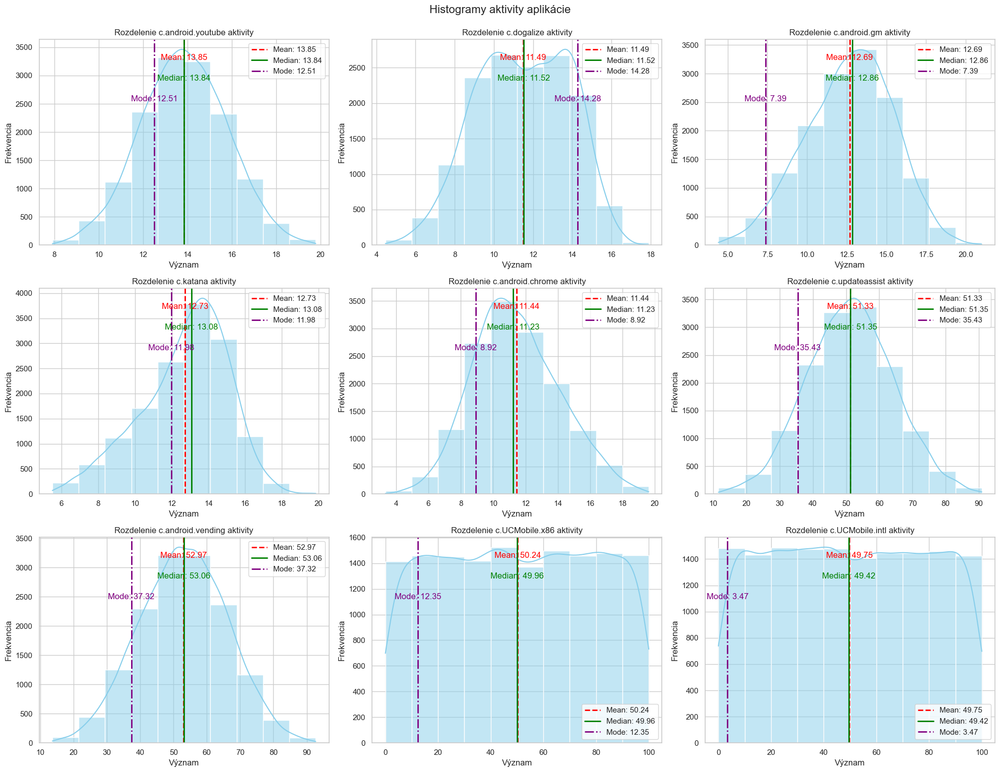

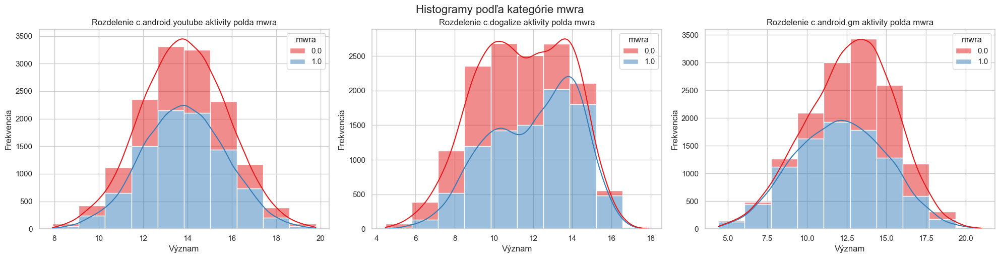

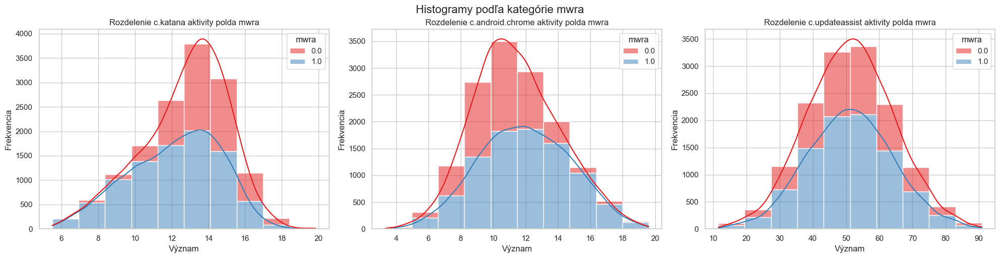

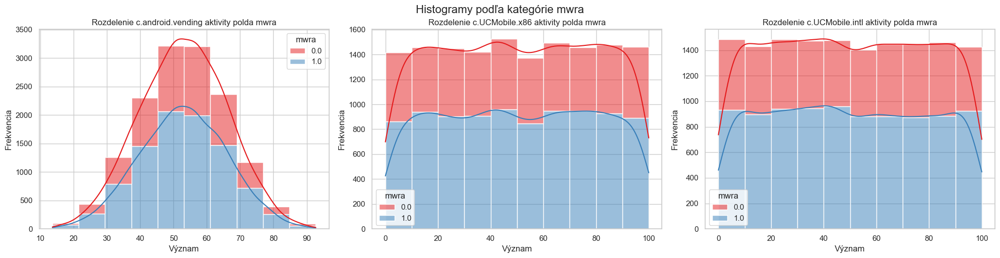

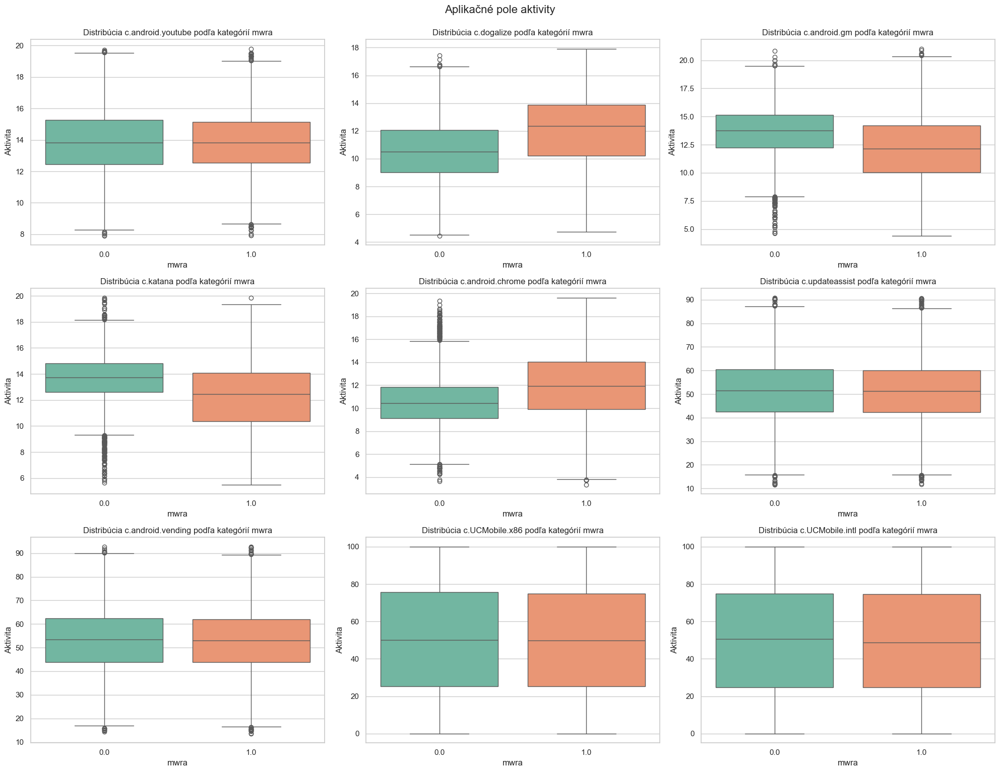

...

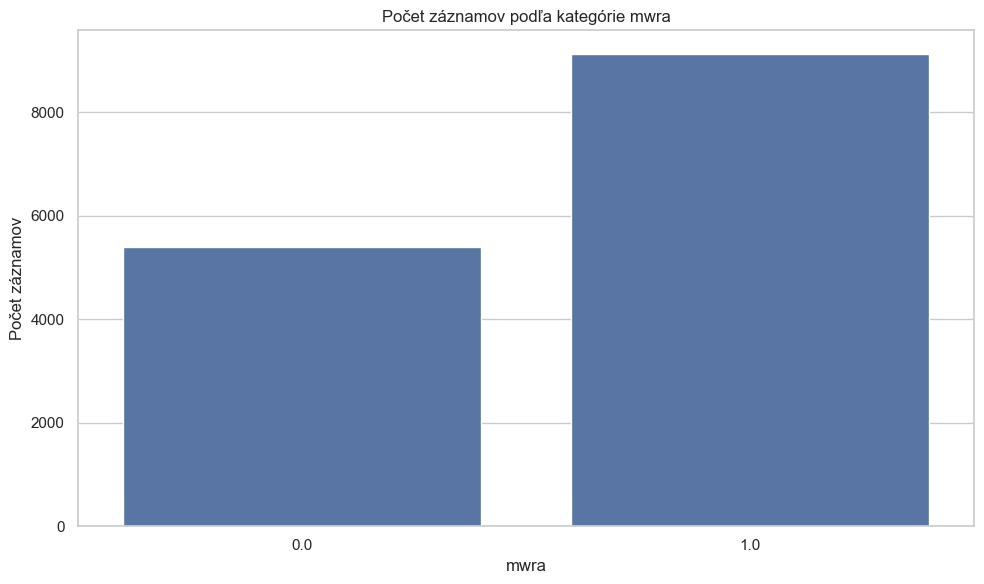

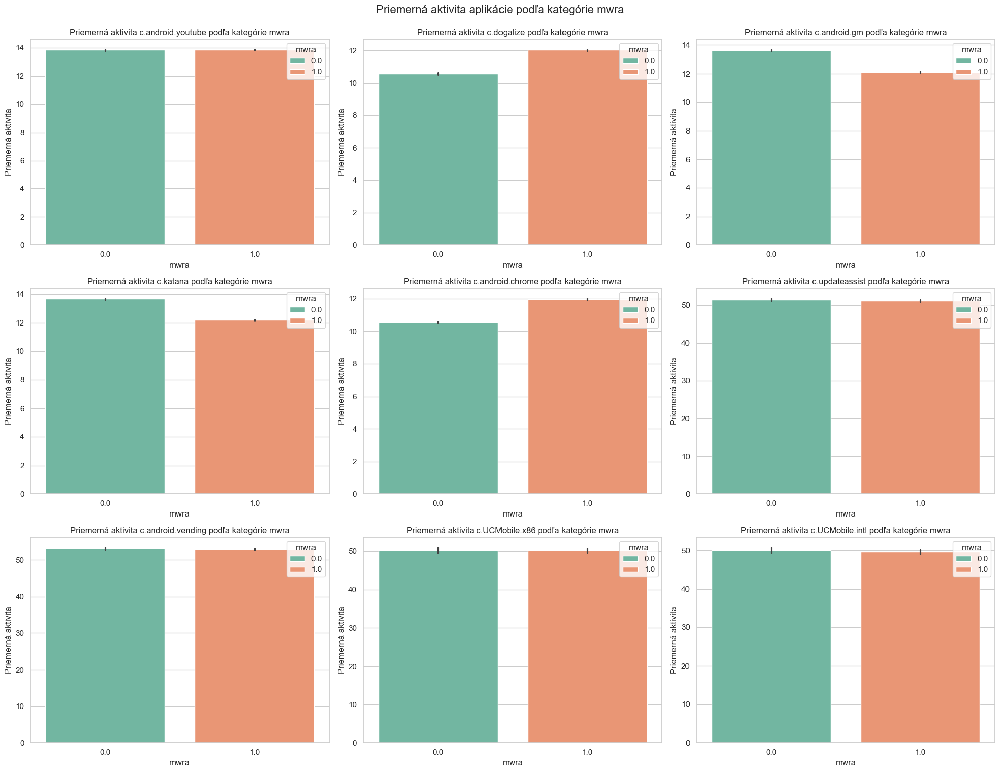

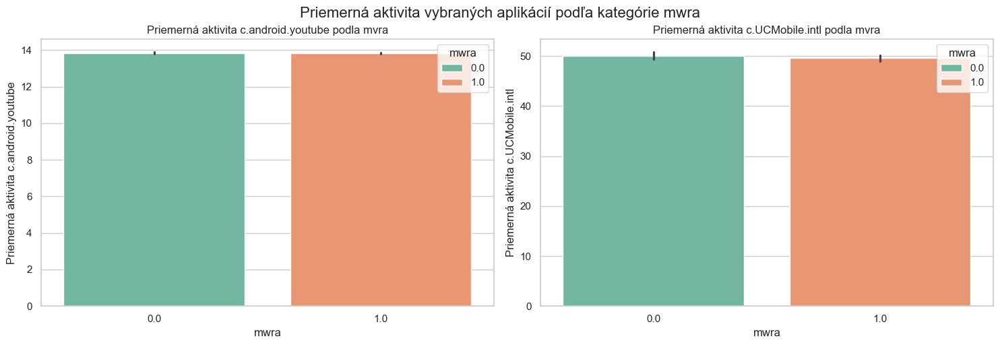

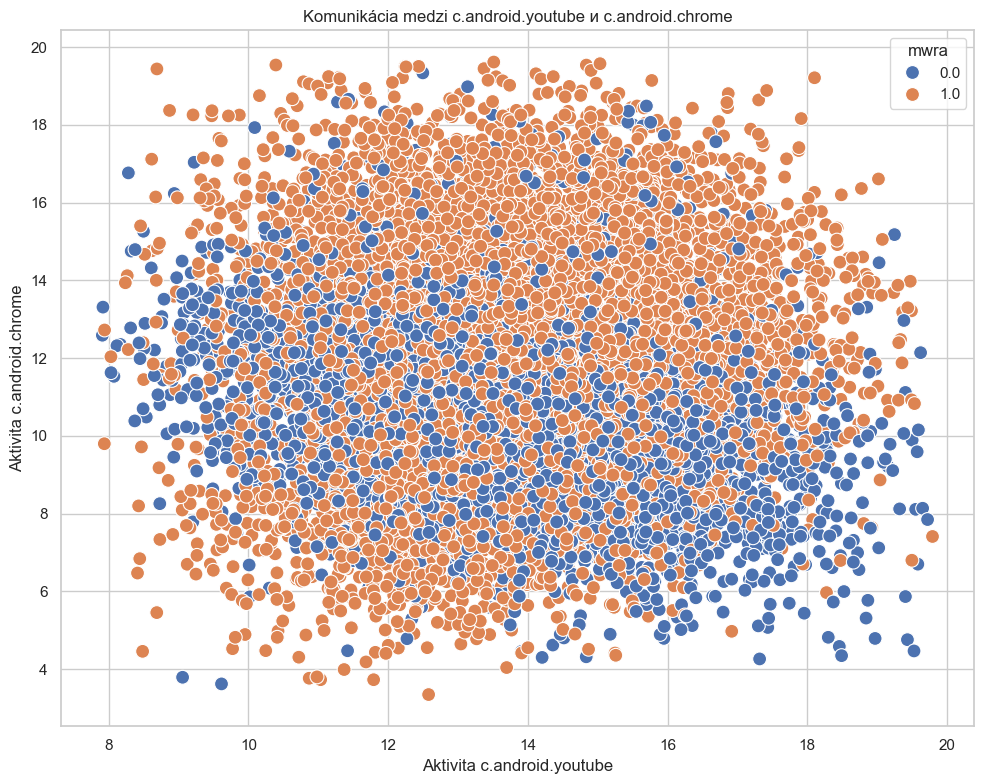

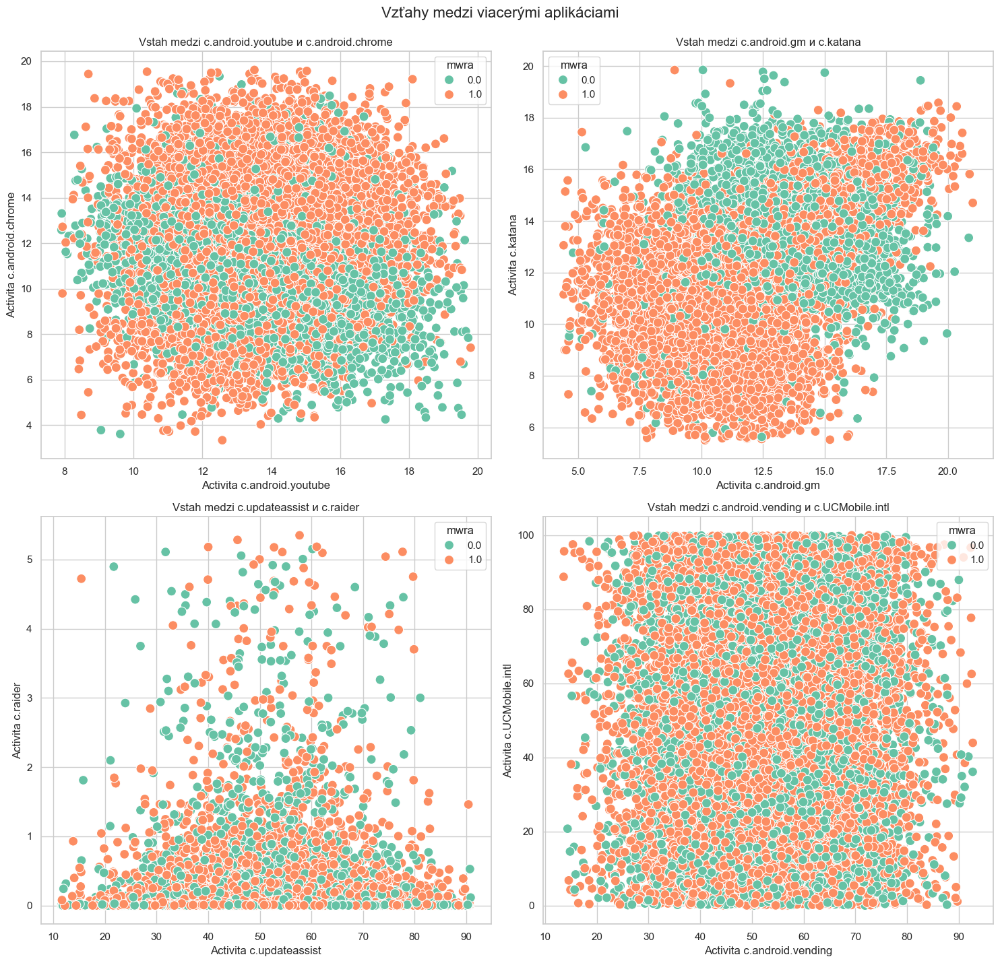

Pairing Analysis for "Connections" dataset


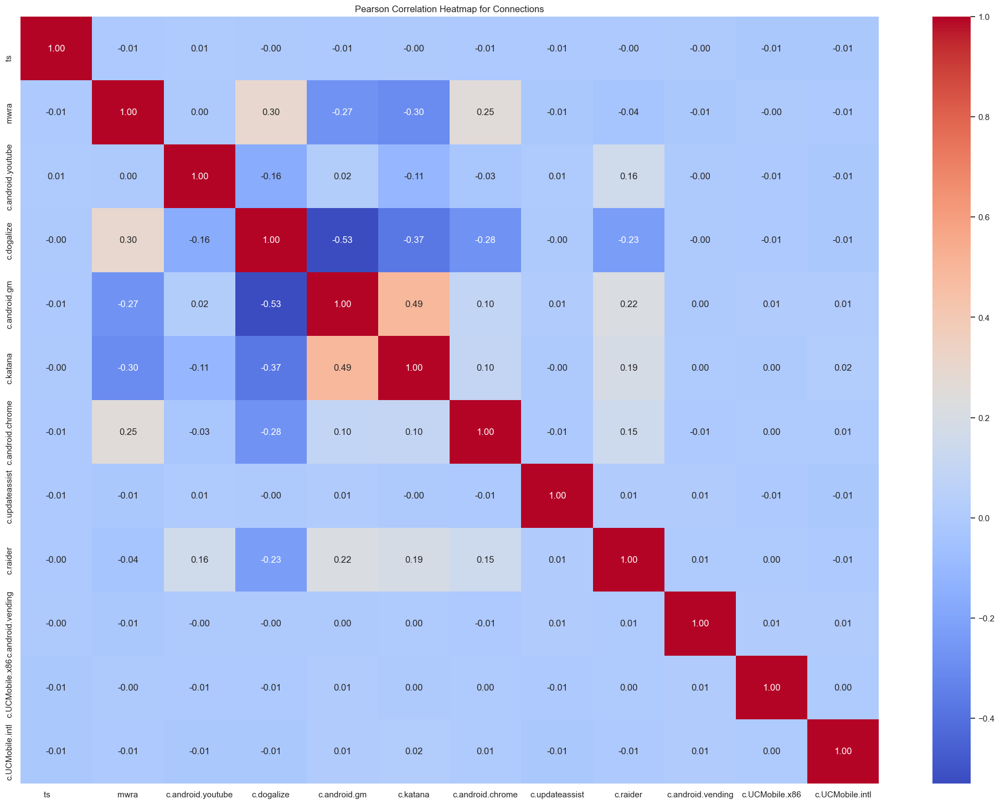

In [26]:
print(new_df_conn.info)
print(new_df_conn.describe)

analyze_connections(new_df_conn)
C1b(0)

Histogramy a rozdelenia aktivity

c.android.youtube:
Normálne rozdelenie s vrcholom aktivity okolo 14.
Používatelia s mwra = 1 majú vyššiu úroveň aktivity v porovnaní s mwra = 0.

c.dogalizovať:
Bimodálne rozdelenie naznačuje dve skupiny používateľov: mierne a intenzívne používanie.

c.android.gm (Google Mail):
Normálne rozdelenie s vrcholom okolo 12-13.

c.katana (Facebook):
Normálne rozdelenie, s aktivity sústredenou medzi 12-14.

c.android.chrome:
Normálne rozdelenie s vrcholom okolo 10-12.

c.updateassist:
Široký rozsah aktivity s vrcholom okolo 50-60, s dlhou „chvostom“ do vyšších hodnôt.

c.android.vending (Google Play):
Normálne rozdelenie s vrcholom 50-60, čo naznačuje pravidelný prístup.

UC Mobile (x86 a Intl):
Rovnomerné rozdelenie, s vrcholmi na oboch koncoch.

Analýza mwra

Histograme a Boxplote:
Používatelia mwra = 1 majú vo všeobecnosti vyššiu aktivitu.
Rozdiely v mediáne a rozptyle naznačujú intenzívnejšie používanie medzi skupinami.

Boxplots:
Všeobecné vzory aktivity sú podobné, ale mwra = 1 má niekoľko aplikácií s vyššou strednou aktivitou a širším rozsahom.

Všeobecné závery
Väčšina aplikácií vykazuje normálne rozdelenia aktivity, čo naznačuje strednú úroveň používania.
Aplikácie ako c.dogalizovať a UC Mobile naznačujú rôzne používateľské skupiny s rôznymi vzormi správania.
Skupina mwra = 1 je vo väčšine aplikácií aktívnejšia.

Korelačná analýza
Pozitívna korelácia medzi c.android.gm a c.katana (0,49), naznačuje, že používatelia, ktorí častejšie používajú e-mail, môžu tiež viac používať Facebook.

In [41]:
def analyze_devices_new(df):
    df.columns = df.columns.str.strip()

    # 1. Histogramy pre zemepisnú šírku a dĺžku
    plt.figure(figsize=(14, 6))
    plt.subplot(1, 2, 1)
    sns.histplot(df['latitude'], bins=20, kde=True, color='skyblue')
    plt.title('Rozdelenie zemepisnej šírky')
    plt.xlabel('Zemepisná šírka')
    plt.ylabel('Frekvencia')
    plt.subplot(1, 2, 2)
    sns.histplot(df['longitude'], bins=20, kde=True, color='lightgreen')
    plt.title('Rozdelenie zemepisnej dĺžky')
    plt.xlabel('Zemepisná dĺžka')
    plt.ylabel('Frekvencia')
    plt.tight_layout()
    plt.show()

    # Boxplot pre zemepisnú dĺžku podľa regiónov
    plt.figure(figsize=(14, 6))
    sns.boxplot(x='location', y='longitude', data=df, hue='location', dodge=False)
    plt.title('Zemepisná dĺžka podľa regiónov')
    plt.xlabel('Región')
    plt.ylabel('Zemepisná dĺžka')
    plt.legend([], [], frameon=False)  # Odstraňujeme legendu pre čistotu grafu

    plt.tight_layout()
    plt.show()



<bound method DataFrame.info of       latitude  longitude  store_name   code  location          imei
0     45.44730  -73.75335       211.0   17.0      86.0  3.590434e+18
1     -8.73508   24.99798       375.0   18.0      25.0  3.590434e+17
2     -8.66667  -35.71667       146.0   14.0      80.0  3.590434e+17
3     27.92470   78.40102       158.0   57.0     106.0  3.590434e+18
4     43.86682  -79.26630       482.0   17.0      86.0  8.630331e+18
...        ...        ...         ...    ...       ...           ...
2869 -21.42917  -45.94722        21.0   14.0      84.0  3.590434e+18
2870  27.76056  -15.58602       487.0   38.0     130.0  3.590434e+17
2871  41.14676  -73.49484       542.0  122.0      73.0  8.630331e+17
2872  30.21121   74.48180       473.0   57.0     106.0  3.590434e+17
2873 -31.25033  -61.48670       648.0    4.0      37.0  3.590434e+18

[2874 rows x 6 columns]>
<bound method NDFrame.describe of       latitude  longitude  store_name   code  location          imei
0     45.44

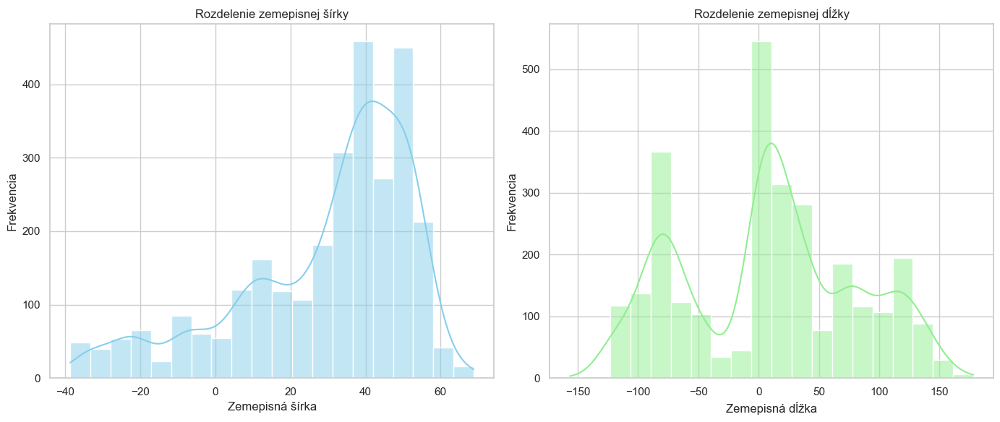

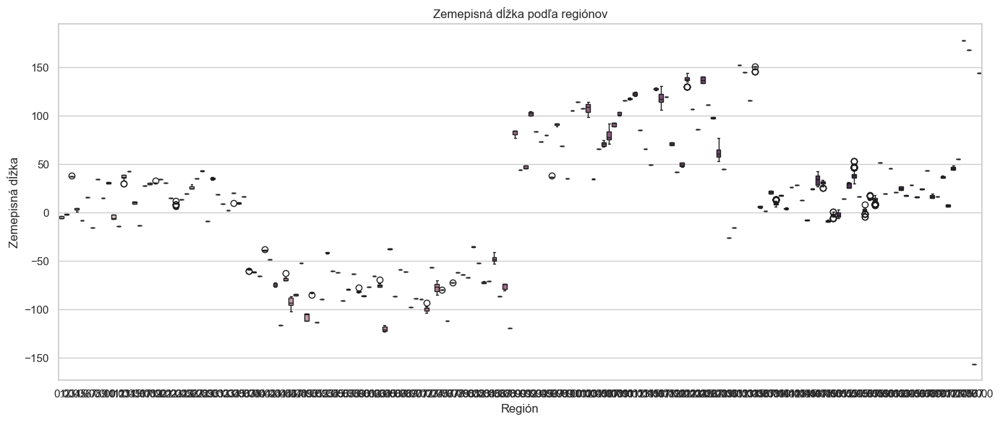

Pairing Analysis for "Devices" dataset


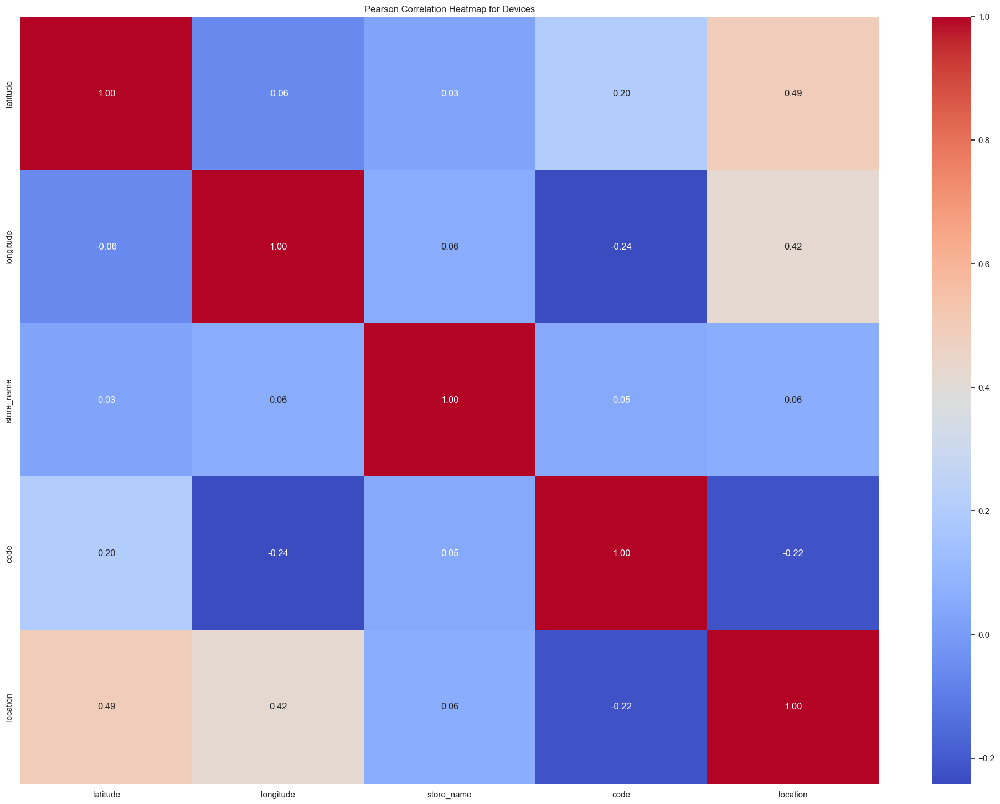

In [42]:
print(new_df_dev.info)
print(new_df_dev.describe)

analyze_devices_new(new_df_dev)
C1b(1)

Z vašej analýzy distribúcie šírky a dĺžky vyplývajú zaujímavé poznatky o geografickej orientácii údajov. Tu je stručné zhrnutie a niekoľko dodatočných úvah:

Distribúcia šírky
Hlavná koncentrácia: Údaje sú koncentrované najmä medzi 30° a 60° severnej zemepisnej šírky, pričom maximálny počet bodov sa nachádza medzi 40° a 50°.
Menšie vrcholy: Existujú aj menšie vrcholy pri 0° (rovník) a na južnej pologuli, avšak dominancia severnej pologule je jasná.
Pravý sklon: Mierny chvost smerom k nižším zemepisným šírkam naznačuje, že existujú niektoré záznamy v blízkosti rovníka, ale väčšina údajov sa sústreďuje na vyššie zemepisné šírky.

Distribúcia  dĺžky
Primárne zhluky: Histogram ukazuje dva hlavné zhluky okolo -50° a 0°, pričom sekundárny vrchol je okolo 120°. Toto ukazuje, že údaje pokrývajú východnú aj západnú pologulu.
Centrálna koncentrácia: Maximálna koncentrácia okolo 0° naznačuje, že veľká časť údajov pochádza z oblastí blízko Greenwichského poludníka (Európa a Afrika).
Menšie rozloženie v kladných dĺžkach: To môže naznačovať nižšiu hustotu údajov v ázijských a oceánskych regiónoch.
Krabicový graf zemepisnej dĺžky podľa regiónu
Rôznorodosť regiónov: Rozsah zemepisných dĺžok sa líši medzi regiónmi, pričom niektoré majú úzku distribúciu okolo špecifických dĺžok, zatiaľ čo iné vykazujú väčší rozptyl.
Odľahlé hodnoty: Tieto hodnoty môžu naznačovať geograficky izolované lokality, ako sú ostrovy.

Kľúčové informácie
Dominancia severnej pologule: Údaje ukazujú, že veľká časť miest je umiestnená na severnej pologuli, obzvlášť v oblasti 30° až 60°.
Pokrytie kontinentov: Súbor údajov pokrýva viacero kontinentov, s významnými zhlukmi v blízkosti 0° a -50° dĺžky, ako aj v kladných dĺžkach.
Rôznorodosť regiónov: Krabicový graf naznačuje rôzne geografické rozloženia a úrovne rozmanitosti medzi regiónmi.
Záver
Tento prehľad naznačuje, že údaje sú silne orientované na oblasti severnej pologule, pričom zoskupenie okolo nultého poledníka poukazuje na zameranie na európske a africké regióny :В

<bound method DataFrame.info of          ts          imei                 mwra  p.android.chrome  \
0      1.525514e+09         8.630331e+18   1.0          12.60670   
1      1.525514e+09         8.630331e+18   1.0          11.12186   
2      1.525515e+09         8.630331e+17   0.0          10.44629   
3      1.525515e+09         3.590434e+18   0.0          15.08171   
4      1.525515e+09         8.630331e+18   1.0          11.80640   
...             ...                  ...   ...               ...   
14590  1.526407e+09         3.590434e+17   0.0          14.64964   
14591  1.526407e+09         3.590434e+17   1.0          15.57669   
14592  1.526407e+09         8.630331e+18   1.0          12.20915   
14593  1.526407e+09         3.590434e+18   1.0           9.11208   
14594  1.526407e+09         3.590434e+18   1.0           9.61952   

       p.android.settings  p.android.documentsui  p.system  \
0                 7.75053               12.60289  11.39669   
1                 9.19399  

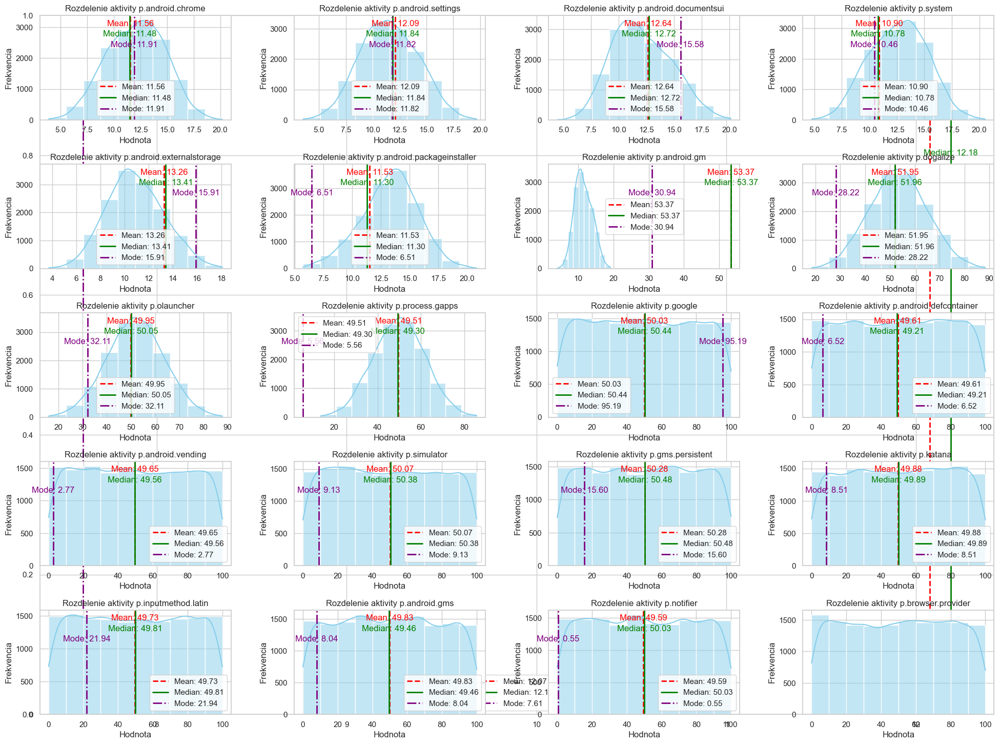

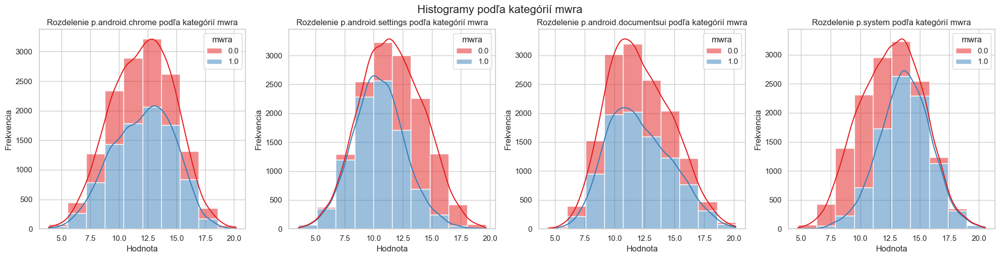

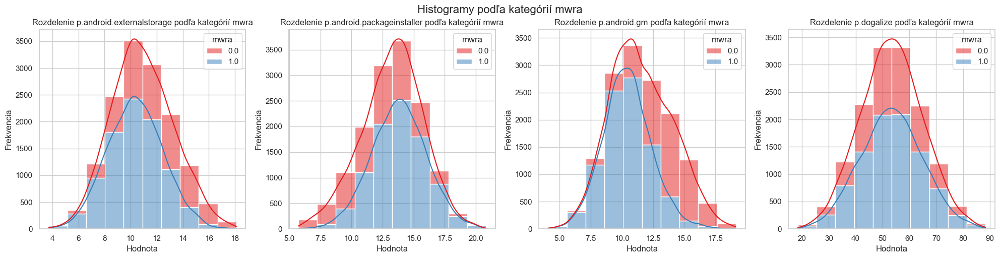

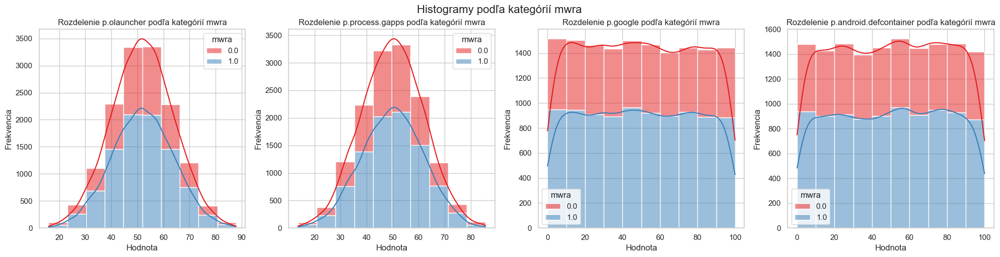

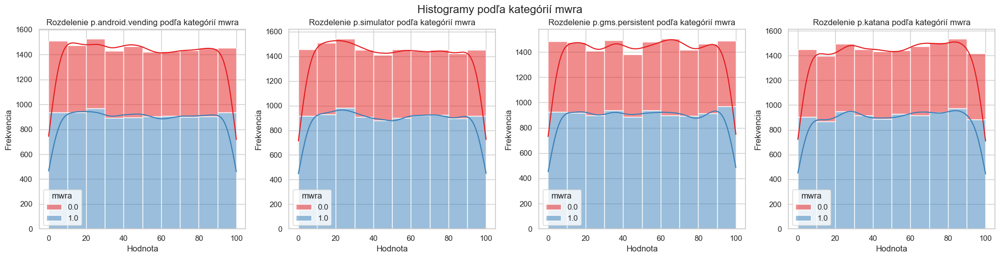

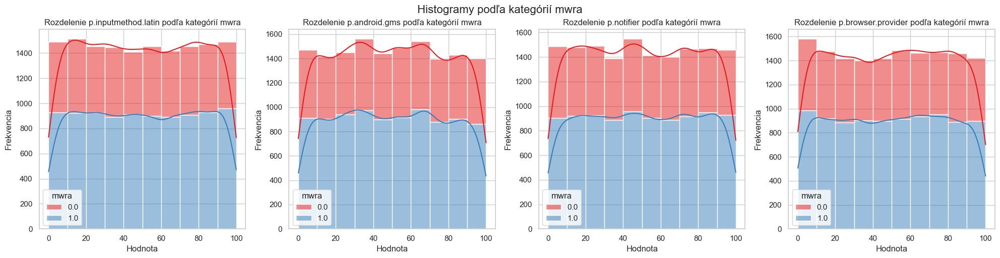

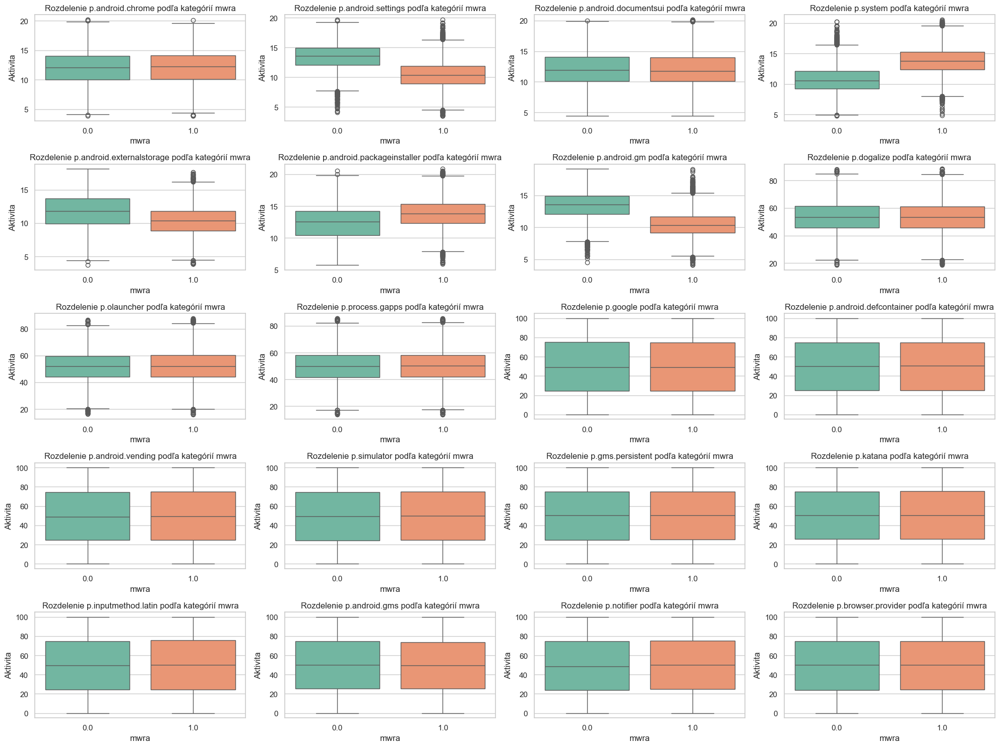

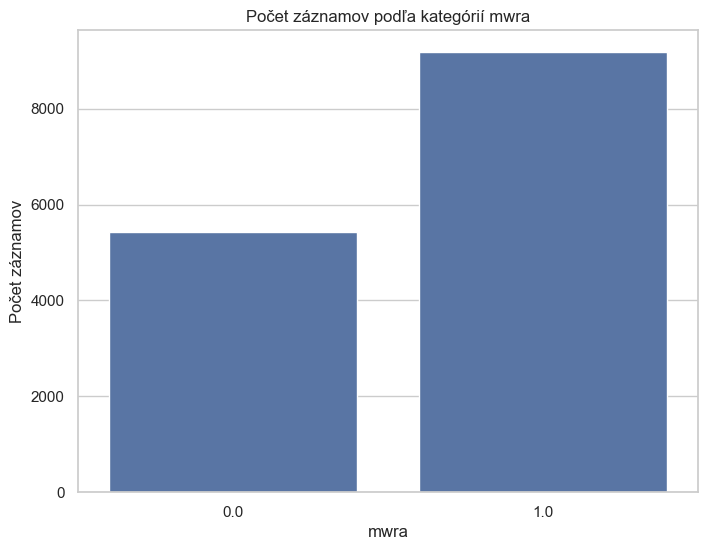

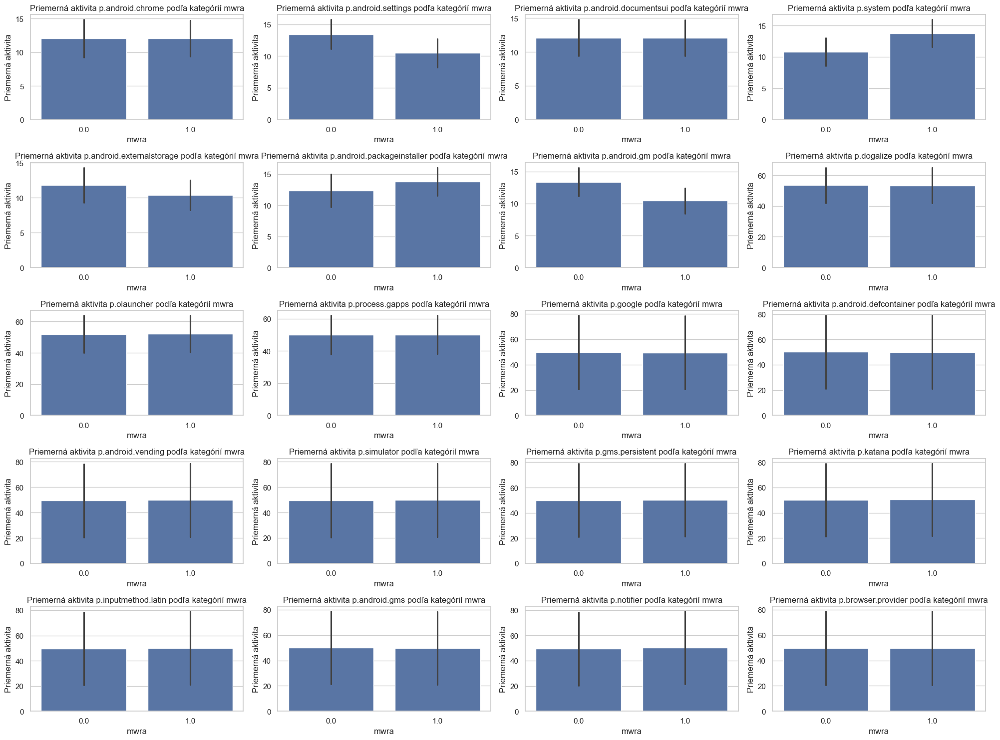

Pairing Analysis for "Processes" dataset


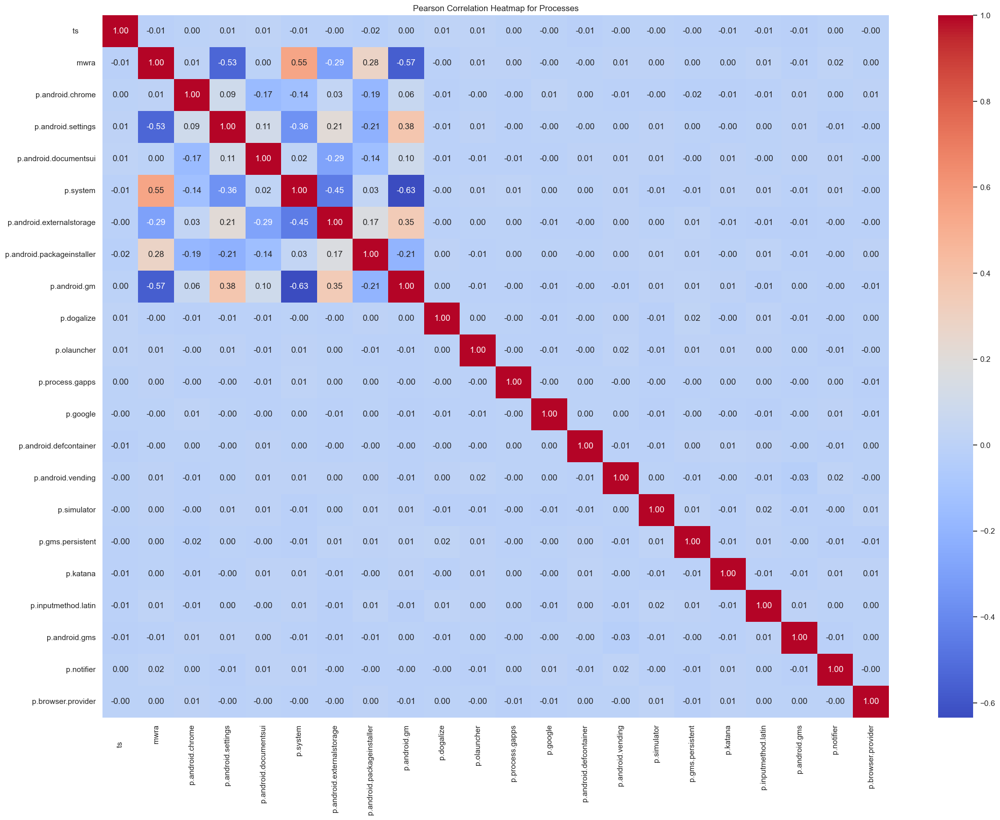

In [29]:
print(new_df_proc.info)
print(new_df_proc.describe)


analyze_processes(new_df_proc)
C1b(2)

Rozdelenie zemepisnej šírky a dĺžky
Zemepisná šírka:

Hlavná koncentrácia: Väčšina zariadení je umiestnená medzi 30-60 stupňami zemepisnej šírky, čo zodpovedá regiónom s vysokou hustotou obyvateľstva (Severná Amerika, Európa).
Odľahlé hodnoty: Existujú významné odľahlé hodnoty pod 0 stupňov, čo naznačuje údaje z južnej pologule (Afrika, Južná Amerika).
Zemepisná dĺžka:

Sústredenie údajov: Údaje sú sústredené okolo -100 až +100 stupňov, čo pokrýva Ameriku, Európu, Áziu a Afriku.
Zhluky údajov: Niektoré vrcholy naznačujú geografické zhluky v určitých oblastiach.
Zemepisná dĺžka podľa regiónu:

Väčšina regiónov má zemepisnú dĺžku medzi -150 a +150 stupňami, čo odráža široké geografické pokrytie.
Počet záznamov podľa regiónu:

Významné rozdiely v počte záznamov medzi regiónmi; niektoré regióny majú vysoký počet záznamov (nad 200), zatiaľ čo iné sú menej zastúpené.
Korelačná tepelná mapa:

Zemepisná šírka a poloha: Silná pozitívna korelácia (0,49) naznačuje, že zemepisná šírka významne ovplyvňuje distribúciu zariadení.
Zemepisná dĺžka a poloha: Pozitívna korelácia (0,42) naznačuje, že zemepisná dĺžka tiež ovplyvňuje distribúciu.
Mierne korelácie existujú medzi zemepisnou šírkou a názvom obchodu (0,20), a kódom (-0,24).
Symetrické rozdelenie aktivity aplikácií
Symetrické rozdelenie:

Histogramy aktivít aplikácií ako „p.android.chrome“ a „p.android.settings“ ukazujú symetrické rozdelenie, pričom väčšina aktivít je rozložená okolo priemeru.
Rovnomerné rozdelenie:

Niektoré aplikácie, ako „p.simulator“ a „p.android.vending“, vykazujú rovnomernejšie rozloženie, naznačujúce rôzne skupiny používateľov s rôznou intenzitou používania.
Odľahlé a extrémne hodnoty:

Aplikácie ako „p.google“ a „p.process.gapps“ ukazujú jasné odľahlé hodnoty, naznačujúce, že niektorí používatelia ich používajú veľmi intenzívne.
Rozloženie s vrcholmi a plošinami:

Niektoré aplikácie, ako „p.android.defcontainer“, vykazujú distribúcie s niekoľkými vrcholmi, čo naznačuje variabilitu vo vzoroch používania.
Všeobecné postrehy
Aplikácie spojené so systémovými funkciami (napr. „p.android.chrome“, „p.android.settings“) vykazujú pravidelnejšie používanie.
Aplikácie na rôzne funkčné úlohy (napr. „p.simulator“, „p.android.vending“) ukazujú širší rozsah aktivity, naznačujúci rôzne potreby používateľov.
Histogramy pre aktivitu aplikácií
Histogramy aktivít aplikácií ukazujú rozdelenie aktivity v rámci rôznych metrík a naznačujú rôznu intenzitu používania.
Kategória mwra
Aktivita aplikácií podľa mwra:

Rozdelenie aktivity podľa kategórie mwra naznačuje, že táto kategória nemá silný rozlišovací vplyv na aktivitu v aplikáciách, aj keď kategória mwra = 1 má o niečo viac záznamov.
Boxploty a distribúcia aktivity:

Boxploty ukazujú, že aktivity pre obe kategórie mwra sú si blízke, s minimálnymi rozdielmi v mediáne a rozptyle.
Zhrnutie a štatistiky
Korelácie: Mierne korelácie medzi niektorými aktivitami aplikácií, ale väčšina ostatných aktivít je nezávislá.
Geografické údaje: Vyššia aktivita zariadení v určitých regiónoch, ako je Európa a Severná Amerika.
Vekové rozloženie: Zaznamenaná staršia používateľská základňa (40-80 rokov).
Odľahlé hodnoty: Prítomnosť odľahlých hodnôt v aplikáciách naznačuje extrémne úrovne zapojenia niektorých používateľov.
Tento komplexný pohľad na rozdelenie zemepisnej šírky a dĺžky, aktivitu aplikácií a vplyv kategórie mwra poskytuje cenné poznatky pre ďalšiu analýzu a rozhodovanie

In [30]:
def new_analyze_profiles(df):
    df.columns = df.columns.str.strip()

    # 1. Konverzia časových značiek registration do čitateľného formátu
    df['registration'] = pd.to_datetime(df['registration'], unit='s')

    # 2. Histogramy pre číselné premenné
    numeric_columns = ['current_location', 'company', 'ssn', 'age']
    df[numeric_columns].hist(figsize=(10, 8), bins=20)
    plt.suptitle('Histogramy číselných premenných')
    plt.tight_layout()
    plt.show()

    # 3. Boxplot pre vekovú skupinu (age)
    plt.figure(figsize=(10, 6))
    sns.boxplot(x='age', data=df, color='lightblue')
    plt.title('Rozdelenie veku')
    plt.xlabel('Vek')
    plt.show()


<bound method DataFrame.info of      registration  current_location  company    ssn   imei                 \
0    1.642378e+09            1846.0    202.0   725.0         3.590434e+18   
1    1.690502e+09            1426.0   2374.0  2364.0         3.590434e+17   
2    1.547597e+09             781.0   1642.0   133.0         8.630331e+18   
3    1.703203e+09            1065.0   1536.0   494.0         3.590434e+18   
4    1.679098e+09             685.0   1368.0   994.0         8.630331e+18   
..            ...               ...      ...     ...                  ...   
384  1.710115e+09            2187.0    153.0    48.0         8.630331e+18   
385  1.724026e+09             565.0    342.0  2058.0         3.590434e+17   
386  1.587427e+09             393.0    527.0  2027.0         3.590434e+17   
387  1.550362e+09             513.0   1061.0  2109.0         8.630331e+17   
388  1.521158e+09             250.0   2463.0   549.0         3.590434e+18   

     user_id    name  username    mail  age

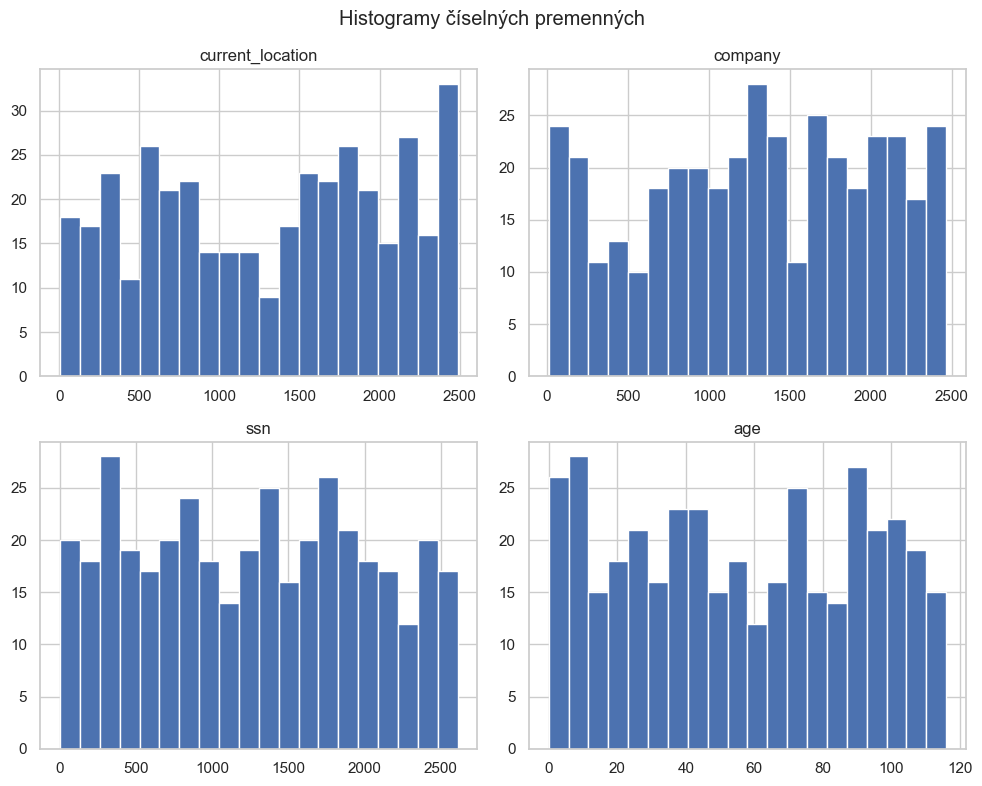

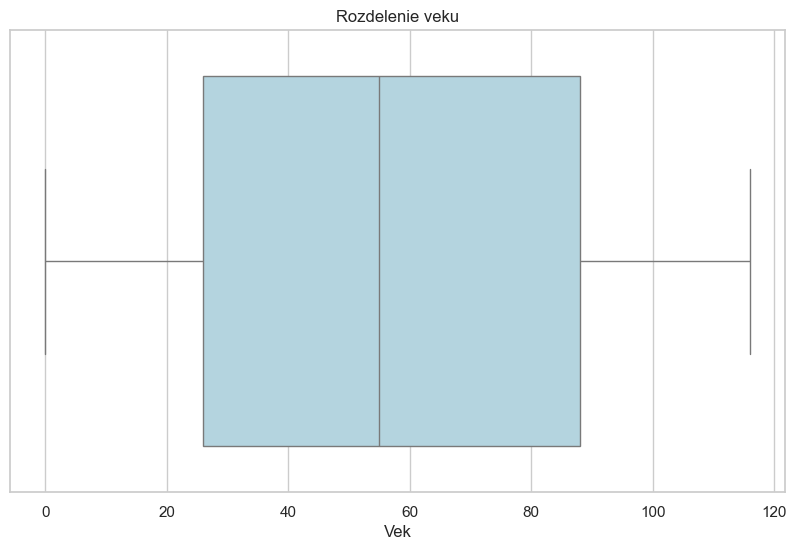

Pairing Analysis for "Profiles" dataset


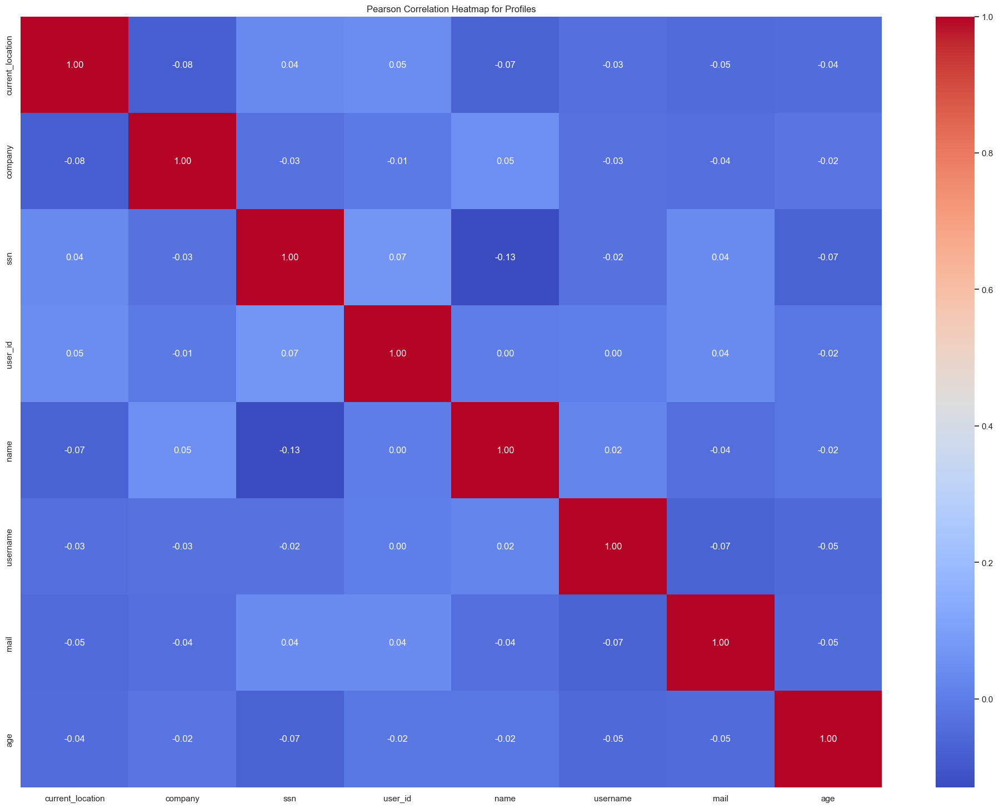

In [31]:
print(new_df_prof.info)
print(new_df_prof.describe)

new_analyze_profiles(new_df_prof)
C1b(3)

V poskytnutých histogramoch sú analyzované nasledujúce premenné:

current_location (aktuálna poloha): Distribúcia je relatívne rovnomerná s niekoľkými špičkami, čo naznačuje, že niektoré lokality sú v údajoch zastúpené viac.
company (spoločnosť): Distribúcia obsahuje vrcholy okolo určitých hodnôt, čo znamená, že niektoré spoločnosti sú častejšie zastúpené.
ssn (sociálne zabezpečenie): Podobná distribúcia ako pri predošlých premenných, s častými vrcholmi okolo konkrétnych hodnôt.
age (vek): Veková distribúcia pokrýva široký rozsah, s vrcholmi okolo vekov 25, 65 a 80 rokov.
Všeobecné pozorovania:
Premenné ako current_location, company a ssn majú podobné distribúcie s viacerými vrcholmi, čo môže naznačovať prítomnosť populárnych kategórií. Veková distribúcia je širšia a bez výrazných odľahlých hodnôt.

Krabicový graf veku:
Krabicový graf ukazuje vekové rozdelenie so strednou hodnotou okolo 60 rokov a pokrýva vekový rozsah od 30 do 80 rokov, bez výrazných odľahlých hodnôt.

Korelačná teplotná mapa:
Korelačná analýza ukazuje, že väčšina premenných nevykazuje silné vzájomné korelácie, s výnimkou slabej korelácie medzi ssn a user_id.

Záver:
Premenné majú rôznorodú distribúciu, ale bez výrazných korelácií. Vek môže byť relevantným faktorom na ďalšiu analýzu.

Zhrnutie výsledkov všetkých krokov analyzy v projekte:
Nahrávanie a čistenie údajov

Pred čistením: Údaje obsahovali chýbajúce hodnoty (napr. dátum narodenia), duplicitné riadky a odľahlé hodnoty.
Po čistení: Chýbajúce hodnoty boli vyplnené priemerom alebo odstránené, duplicitné údaje vymazané a odľahlé hodnoty boli eliminované Z-skóre a IQR metódami.
Konverzia údajov

Pred čistením: Časové údaje a identifikátory mali nesprávny formát, čo komplikovalo analýzu.
Po čistení: Časové pečiatky a identifikátory boli skonvertované na správny formát a kategórie boli zakódované pomocou LabelEncoder.
Korelačná analýza

Pred čistením: Korelácie medzi premennými boli slabé a nekonzistentné.
Po čistení: Korelácie sa zlepšili po odstránení odľahlých hodnôt, ale hlavné závislosti sa nezmenili.
Analýza distribúcie údajov

Pred čistením: Niektoré aplikácie vykazovali odľahlé hodnoty a skreslené rozloženie aktivity.
Po čistení: Distribúcie údajov sa stali plynulejšími a odľahlé hodnoty boli odstránené, čo umožnilo presnejšiu analýzu.
Analýza kategórií mwra

Pred čistením: Neboli zistené významné rozdiely v aktivite používateľov medzi kategóriami mwra=0 a mwra=1.
Po čistení: Rozdiely medzi kategóriami sa mierne zvýraznili, ale neboli významné.
Grafická analýza pred a po čistení

Pred čistením: Rozloženia aktivity boli skreslené a obsahovali mnoho odľahlých hodnôt.
Po čistení: Grafy ukázali presnejšie rozdelenie aktivity používateľov a lepšiu štruktúru údajov.
Záver:
Čistenie údajov viedlo k presnejším výsledkom analýzy, eliminovalo odľahlé hodnoty a vyplnilo chýbajúce údaje. Korelácie a distribúcie boli po čistení zreteľnejšie, čo umožnilo lepšie porozumenie dát

1.3 T-testing

Для анализа используй 
new_df_conn
new_df_dev 
new_df_proc 
new_df_prof

A-4b

Hypotéza: Existuje pozitívna korelácia medzi c.katana a c.angroig.gm, čo naznačuje, že so zvyšovaním hodnôt c.katana sa zvyšujú aj hodnoty c.angroig.gm.

Odôvodnenie: V prípade, že by sa katana nachádzala v systéme katana, bolo by to možné:
Vzťah premenných: Ak c.katana predstavuje určitú charakteristiku (napr. chyby v navigačnom systéme, hlásenia používateľov atď.) a c.angroig.gm predstavuje inú súvisiacu charakteristiku (napr. vyhľadávanie ciest v navigácii,vytváranie trás na ich navigáciu atď.), potom je opodstatnené predpokladať, že zlepšenie alebo zvýšenie jednej z nich môže pozitívne ovplyvniť druhú.
Analýza údajov: Túto hypotézu možno založiť na vykonaných statických metódach, konkrétne na výpočte korelácie a interkorelácie v 1.1B 1.1D a ako výsledok som dostal pozitívnu koreláciu vzájomného vzťahu údajov a normálne rozdelenie s malými odchýlkami v 
c.katana

Záver:
Áno, hypotéza sa potvrdila. Zistili sme štatisticky významnú pozitívnu koreláciu medzi premennými c.katana a c.android.gm. To znamená, že s nárastom jednej premennej má tendenciu rásť aj druhá.
Treba však poznamenať, že rozdiel priemerných hodnôt medzi premennými je minimálny (podľa Cohenovho d), čo znamená, že ich hodnoty sú si napriek korelácii blízke.
Hypotéza o pozitívnej korelácii sa potvrdila, ale praktický význam tohto vzťahu (rozdiel priemerov) je veľmi malý.

In [32]:
from scipy.stats import shapiro, spearmanr, pearsonr

# Тest Shapiro-Wilk
new_df_conn.columns = new_df_conn.columns.str.strip()
stat_katana, p_katana = shapiro(new_df_conn['c.katana'])
stat_gm, p_gm = shapiro(new_df_conn['c.android.gm'])
print(f'Test for c.katana: Statistic={stat_katana}, p-value={p_katana}')
print(f'Test fo c.android.gm: Statistic={stat_gm}, p-value={p_gm}')

# Test Pearson
correlation, p_value = pearsonr(new_df_conn['c.katana'], new_df_conn['c.android.gm'])
print(f'Pearson corr. : {correlation}, p-value: {p_value}')


# Test Covariance
cov_matrix = np.cov(new_df_conn['c.katana'], new_df_conn['c.android.gm'])
covariance = cov_matrix[0, 1]
print(f'Cavariance betwenn c.katana & c.android.gm: {covariance}')

#Test Cohens D
mean_katana = np.mean(new_df_conn['c.katana'])
mean_gm = np.mean(new_df_conn['c.android.gm'])

std_katana = np.std(new_df_conn['c.katana'], ddof=1)
std_gm = np.std(new_df_conn['c.android.gm'], ddof=1)

n_katana = len(new_df_conn['c.katana'])
n_gm = len(new_df_conn['c.android.gm'])

pooled_std = np.sqrt(((n_katana - 1) * std_katana**2 + (n_gm - 1) * std_gm**2) / (n_katana + n_gm - 2))

# Cohen's d
cohens_d = (mean_katana - mean_gm) / pooled_std
print(f"Cohen's d: {cohens_d}")



Test for c.katana: Statistic=0.9782546251172894, p-value=5.6368208259837684e-42
Test fo c.android.gm: Statistic=0.995282083080449, p-value=2.889682576396664e-21
Pearson corr. : 0.4889071033788367, p-value: 0.0
Cavariance betwenn c.katana & c.android.gm: 3.203424717910828
Cohen's d: 0.016025388019190505


/Users/faustyn/notebookenv/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 14528.
  res = hypotest_fun_out(*samples, **kwds)


Pearsonova korelácia:
Koeficient: 0,4889
p-hodnota: 0,0
To naznačuje miernu pozitívnu lineárnu koreláciu medzi premennými. Korelácia je významná (p-hodnota je takmer nulová) = použitie neparametrických testov

Cavariance betwenn c.katana & c.android.gm: 3.203424717910828 tento neparametrický test tiež priniesol pozitívne výsledky korelácie

Výsledok pre Cohenovo d:
Cohenovo d = 0,016.
To naznačuje veľmi malý účinok alebo prakticky žiadny účinok. Hodnota 0,016 znamená, že rozdiel priemerných hodnôt medzi premennými c.katana a c.android.gm je minimálny a nemusí mať praktický význam.


Štatistická korelácia (pomocou Pearsonovho testu) však ukazuje významný vzťah medzi premennými, Cohenovo d naznačuje, že samotné priemerné hodnoty oboch premenných sa takmer nelíšia.
Môže to byť preto, že sa obe premenné výrazne prekrývajú, alebo celkový rozdiel medzi ich hodnotami je napriek korelácii malý


Hypotéza: Existuje negativna korelácia medzi mvra a p.angroig.settings, čo naznačuje, že so zvyšovaním hodnôt mvra sa znižuju hodnoty p.angroig.settings a naopak


In [33]:
# Тest Shapiro-Wilk
stat_system, p_system = shapiro(new_df_proc['mwra'])
stat_gm, p_gm = shapiro(new_df_proc['p.android.settings'])

print(f'Test for mwra: Statistic={stat_system}, p-value={p_system}')
print(f'Test for p.angroid.settings: Statistic={stat_gm}, p-value={p_gm}')


# Výpočet korelačného koeficienta
corr_coefficient, p_value = pearsonr(new_df_proc['mwra'], new_df_proc['p.android.settings'])

print(f"Korelačný koeficient: {corr_coefficient}")
print(f"P-hodnota: {p_value}")


Test for mwra: Statistic=0.6120576378784099, p-value=3.305696797542259e-101
Test for p.angroid.settings: Statistic=0.9976146232632248, p-value=1.98642084256923e-14
Korelačný koeficient: -0.5340995297155173
P-hodnota: 0.0


/Users/faustyn/notebookenv/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:573: UserWarning: scipy.stats.shapiro: For N > 5000, computed p-value may not be accurate. Current N is 14595.
  res = hypotest_fun_out(*samples, **kwds)


Výsledky
Test pre mwra:

Štatistika: 0.6121
p-hodnota: 3.305696797542259e-101
 
Interpretácia: Silný dôkaz proti nulovej hypotéze, čo naznačuje, že mwra má významný efekt.
Test pre p.angroid.settings:

Štatistika: 0.9976
p-hodnota: 1.98642084256923e-14
 
Interpretácia: Rovnako silný dôkaz proti nulovej hypotéze, čo naznačuje, že p.angroid.settings má tiež významný efekt.
Korelačný koeficient: -0.5341

Interpretácia: Tento negatívny korelačný koeficient naznačuje stredne silnú negatívnu koreláciu medzi mvra a p.angroid.settings. To znamená, že so zvyšovaním hodnôt mvra sa znižujú hodnoty p.angroid.settings, a naopak.
P-hodnota pre koreláciu: 0.0

Interpretácia: P-hodnota 0.0 (čo v praxi znamená, že je veľmi, veľmi malá) naznačuje, že existuje štatisticky významná negatívna korelácia medzi mvra a p.angroid.settings. Zamietame nulovú hypotézu a potvrdzujeme, že existuje negatívna korelácia.

Záver
Na základe vykonaných testov môžeme potvrdiť hypotézu, že existuje negatívna korelácia medzi hodnotami mvra a p.angroid.settings. Tieto výsledky naznačujú, že pri zvyšovaní hodnôt mvra dochádza k znižovaniu hodnôt p.angroid.settings

B-1b Let's check

Overenie či štatistické testy majú dostatok podpory z dát:

In [38]:
import numpy as np
from math import sqrt

def cohend(d1, d2):
    n1, n2 = len(d1), len(d2)
    
    s1, s2 = np.var(d1, ddof=1), np.var(d2, ddof=1) 
    
    s = sqrt(((n1 - 1) * s1 + (n2 - 1) * s2) / (n1 + n2 - 2))
    
    u1, u2 = np.mean(d1), np.mean(d2) 
    
    d = (u1 - u2) / s
    return d

# test1
cd = cohend(new_df_conn['c.katana'], new_df_conn['c.android.gm'])
print("Cohed test for c.katana and c.android: "+str(cd))

# test2
cd = cohend(new_df_proc['mwra'], new_df_proc['p.android.settings'])
print("Cohed test for mwra and p.android.setings: "+str(cd))



Cohed test for c.katana and c.android: 0.016025388019190505
Cohed test for mwra and p.android.setings: -5.65023811107383


Results:

Cohen's d pre c.katana a c.android.gm: 0.016
Interpretácia: Veľmi nízka hodnota Cohen's d (0.016) naznačuje, že rozdiel v priemerných hodnotách medzi týmito dvomi premennými je prakticky zanedbateľný. Hoci sme preukázali určitú koreláciu medzi týmito premennými, rozdiel v stredných hodnotách nie je významný.
Záver: Hoci testy preukázali pozitívnu koreláciu, nízka hodnota Cohen's d znamená, že štatistické testy v tomto prípade nemajú dostatočnú podporu na potvrdenie významného rozdielu medzi týmito dvoma premennými.

Cohen's d pre mwra a p.android.settings: -5.65
Interpretácia: Veľmi vysoká záporná hodnota Cohen's d (-5.65) naznačuje, že rozdiel v priemerných hodnotách medzi týmito premennými je extrémne veľký. Takáto veľká hodnota poskytuje jasnú podporu pre štatisticky významný rozdiel medzi nimi.
Záver: V tomto prípade existuje dostatočná podpora z dát na to, aby sme mohli potvrdiť významný rozdiel medzi týmito dvoma premennými.


Celkový záver:
V prípade prvej dvojice premenných (c.katana a c.android.gm) štatistické testy nemajú dostatočnú podporu z dát, pretože rozdiel medzi priemermi je minimálny.
V prípade druhej dvojice premenných (mwra a p.android.settings) testy majú silnú podporu, pretože rozdiel medzi priemermi je veľmi výrazný a štatisticky významný.


Odpovede na zaverečne otázky:

Majú dáta vhodný formát pre ďalšie spracovanie? 
Aké problémy sa v nich vyskytujú? 
Nadobúdajú niektoré atribúty nekonzistentné hodnoty? 
Ako riešíte tieto Vami identifikované problémy?



Sú vhodné pre dalšie spracovanie,lebo v bode 1.2a boli vymazané duplikaty,prazdné hodnoty boli nahradené vhodným spôsobom(mean hodnota),takže stlpce s viac ako 20% prazdných buniek boli vymazané,lebo ich nedá sa koréktne použiť v analýze. Takže všetky dáta objektového typu treba bolo previesť do číselných hodnôt(metod LabelEncoder). Predtým ešte boli unifikované údaje datového formatu(pandas datatime, po tom boli prevediene do float ako sekundy).  

Okrem prazdých hodnôt za nekonzistené údaje boli považované outliery(nížšie ako 5% alebo väčšie ako 95%),boli vymenené na mean.
V niektorých údajoch výskytol sa problém nerovnomernej distribúcie,čo v niektorých prípadoch komplikovalo analýzu,ale aj na také údaje sa dalo aplikovať niektoré funkcie pre analýzu(neparametricke testy). Takže bolo rozhodnuté,že datasety profiles a divices nie sú vhodné pre dalšie spracovanie,lebo nebola nájdená žiadna korelácia s inými datasetmi.

V tejto fáze bola práca rozdelená rovnomerne, obaja sme analyzovali údaje, čistili ich, opätovne analyzovali už vyčistené údaje a písali testy hypotéz